# Fuzzy C-Means Clustering applied to Customer Analysis
Author: Amanda Lucas Pereira

ELE2399 Lógica Fuzzy 2021/2

# Importing packages

In [1]:
%reload_ext fuzzycmeans
from dataprep.eda import plot
import matplotlib.pyplot as plt
from fuzzycmeans import *
import pandas as pd
import numpy as np
import seaborn as sns
from fcmeans import FCM
from matplotlib import pyplot as plt


# Loading and pre-processing data

In [2]:
csv_path = 'marketing_campaign.csv'

In [3]:
df = get_dataframe(csv_path)
df.head()

> Found dataframe with 2240 lines.


,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response\r
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,...,5,0,0,0,0,0,0,3,11,0



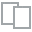
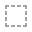
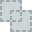
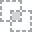
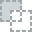
...
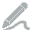
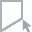
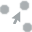
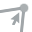
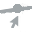

In [4]:
plot(df)

In [5]:
df = df.dropna()
print('> After dropping NaN values:', str(len(df.index)))

> After dropping NaN values: 2216


## Creating/Preprocessing features

### Age

In [6]:
df["Dt_Customer"] = pd.to_datetime(df["Dt_Customer"]) # this column is set as an Object
most_recent_date = df["Dt_Customer"].max()
oldest_date = df["Dt_Customer"].min()
most_recent_date, oldest_date

(Timestamp('2014-12-06 00:00:00'), Timestamp('2012-01-08 00:00:00'))

Note que a data mais recente de cadastro de um novo consumidor é de Dezembro de 2014. Logo, consideraremos 2015 como referência para o cálculo da idade dos consumidores avaliados.

array([[<AxesSubplot:title={'center':'Age'}>]], dtype=object)

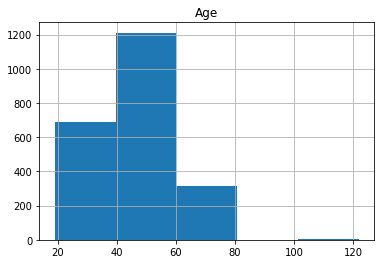

In [7]:
df["Age"] = df["Year_Birth"].apply(get_age, args=[2015])
df.hist(column="Age", bins=5)

In [8]:
df["Age"].min(), df["Age"].max(), np.unique(df["Age"])

(19,
 122,
 array([ 19,  20,  21,  22,  23,  24,  25,  26,  27,  28,  29,  30,  31,
         32,  33,  34,  35,  36,  37,  38,  39,  40,  41,  42,  43,  44,
         45,  46,  47,  48,  49,  50,  51,  52,  53,  54,  55,  56,  57,
         58,  59,  60,  61,  62,  63,  64,  65,  66,  67,  68,  69,  70,
         71,  72,  74,  75, 115, 116, 122]))

Pela célula anterior, notamos alguns outliers: registros a consumidores com mais de 100 anos. Esses dados serão desconsiderado na análise.

In [9]:
df = df[df.Age < 100]
np.unique(df["Age"])

array([19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35,
       36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52,
       53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69,
       70, 71, 72, 74, 75])

(19, 75)

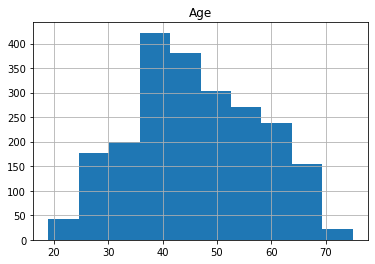

In [10]:
df.hist(column="Age", bins=10)
df.Age.min(), df.Age.max()

### Customer Time

Tempo de cadastro de um consumidor, considerando como referência a data mais recente de cadastro de um novo.

array([[<AxesSubplot:title={'center':'Customer_Time'}>]], dtype=object)

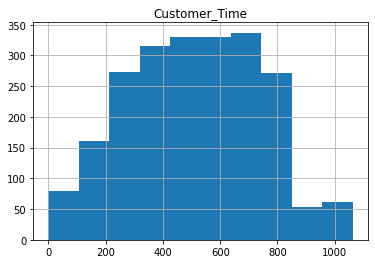

In [11]:
df["Customer_Time"] = df["Dt_Customer"].apply(get_customer_time, args=[most_recent_date])
df.hist(column="Customer_Time", bins=10)

### Total Children

Número de filhos: número de crianças + número de adolescentes.

array([[<AxesSubplot:title={'center':'Total_Children'}>]], dtype=object)

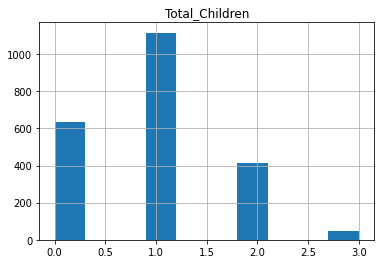

In [12]:
df["Total_Children"] = df["Kidhome"] + df["Teenhome"]
df.hist(column="Total_Children", bins=10)

### Education

In [13]:
df["Education"].value_counts()

Graduation    1116
PhD            480
Master         365
2n Cycle       198
Basic           54
Name: Education, dtype: int64

O algoritmo precisa trabalhar com variáveis numéricas ao invés de categóricas. A função `get_educational_group` realiza o encoding das categorias nominais do atributo "Education".

In [14]:
df["Education"] = df["Education"].apply(get_educational_group)

### Marital Status / Sharing_Home

In [15]:
df["Marital_Status"].value_counts()

Married     857
Together    572
Single      470
Divorced    231
Widow        76
Alone         3
Absurd        2
YOLO          2
Name: Marital_Status, dtype: int64

As categorias serão combinadas em uma nova variável "Sharing_Home": 0 , que corresponde a Marital_Status = ['Alone', 'Absurd', 'YOLO', 'Single', 'Divorced', 'Widow'];
1 = ['Together', 'Married'].

In [16]:
df["Sharing_Home"] = df["Marital_Status"].apply(get_sharing_group)

Os dados precisam ser transformados em categorias númericas através do processo de enconding. A função `get_marital_group` realiza esse processo, atribuindo um número a cada categoria original do atributo.

In [17]:
df["Marital_Status"] = df["Marital_Status"].apply(get_marital_group)

### Total Spent

array([[<AxesSubplot:title={'center':'Total_Spent'}>]], dtype=object)

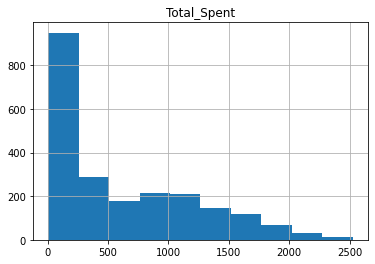

In [18]:
df["Total_Spent"] = df["MntWines"] + df["MntFruits"] + df["MntMeatProducts"] + df["MntFishProducts"] + df["MntSweetProducts"] + df["MntGoldProds"]
df.hist(column="Total_Spent", bins=10)

### Income

array([[<AxesSubplot:title={'center':'Income'}>]], dtype=object)

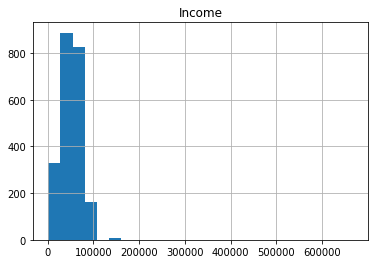

In [19]:
df.hist(column="Income", bins=25)

Do histograma gerado, aparentemente há outliers nessa série. Vamos remove-los.

In [20]:
df = remove_outlier(df, "Income")
print("Número de itens após remoção dos outliers:", str(len(df.index)))

Número de itens após remoção dos outliers: 2205


(1730.0, 113734.0)

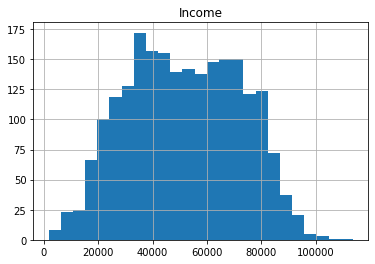

In [21]:
df.hist(column="Income", bins=25)
df.Income.min(), df.Income.max()

### Dropping some columns

In [22]:
cols_to_drop = ["Year_Birth", "Dt_Customer", "ID", "Z_CostContact", "Z_Revenue"]
df_filtered = df.drop(columns=cols_to_drop)
print('Total columns:', len(df_filtered.columns))

Total columns: 29


In [23]:
df_filtered.rename(columns={'Response\r':'Response'}, inplace=True)

## Visualizing relationships between variables

In [24]:
df_filtered.head()

,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,...,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Age,Customer_Time,Total_Children,Sharing_Home,Total_Spent
0,2,0,58138.0,0,0,58,635,88,546,172,...,0,0,0,0,1,58,971,0,0,1617
1,2,0,46344.0,1,1,38,11,1,6,2,...,0,0,0,0,0,61,125,2,0,27
2,2,3,71613.0,0,0,26,426,49,127,111,...,0,0,0,0,0,50,472,0,1,776
3,2,3,26646.0,1,0,26,11,4,20,10,...,0,0,0,0,0,31,65,1,1,53
4,4,4,58293.0,1,0,94,173,43,118,46,...,0,0,0,0,0,34,321,1,1,422


<Figure size 432x288 with 0 Axes>

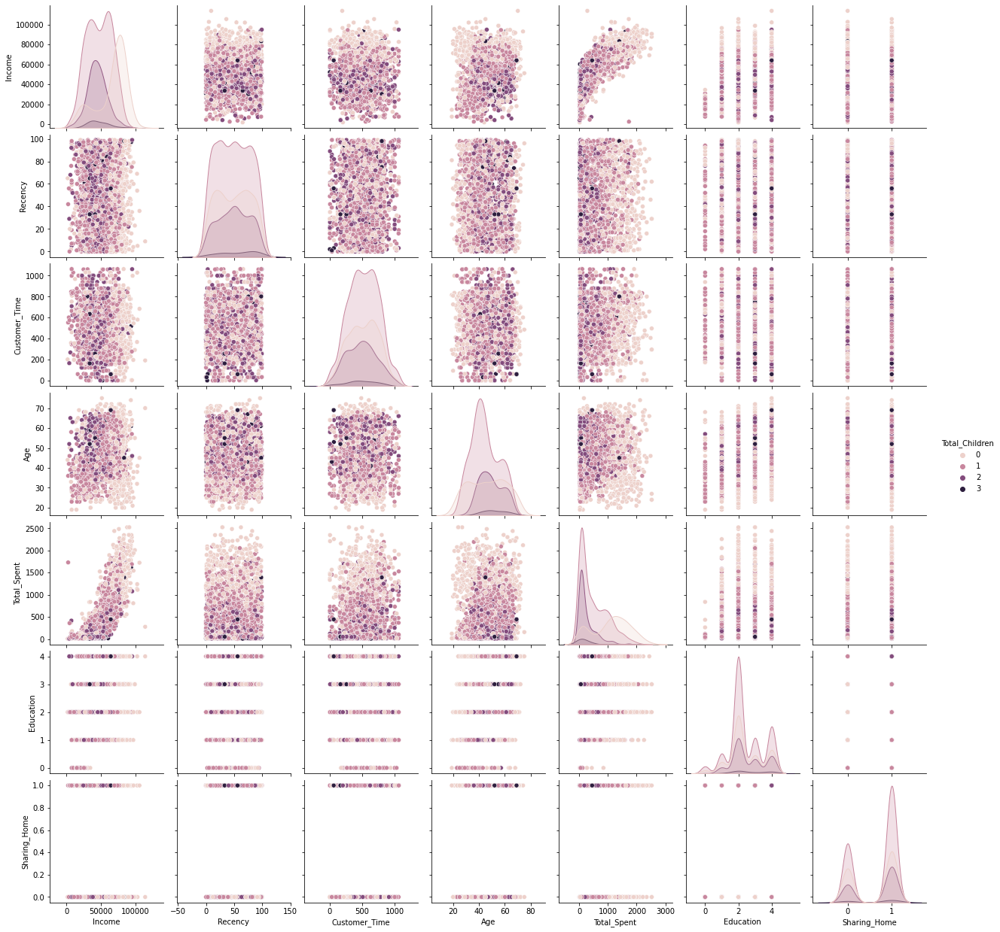

<Figure size 432x288 with 0 Axes>

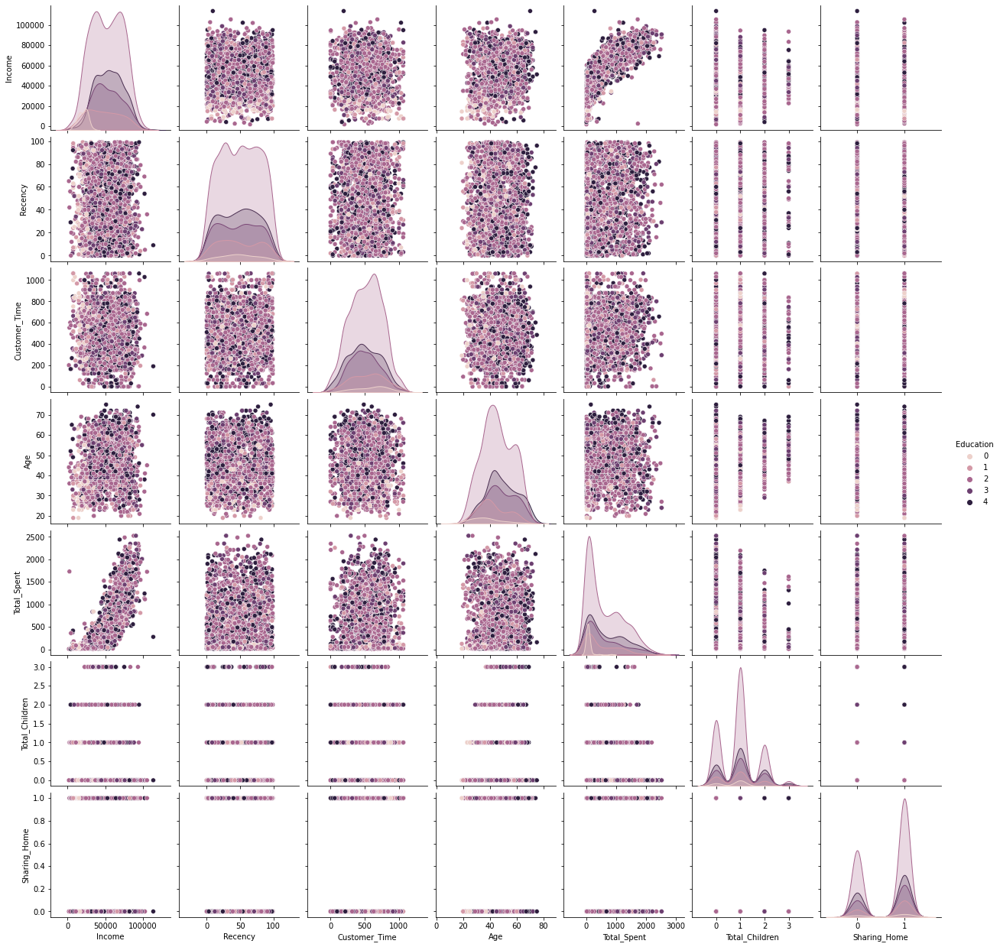

<Figure size 432x288 with 0 Axes>

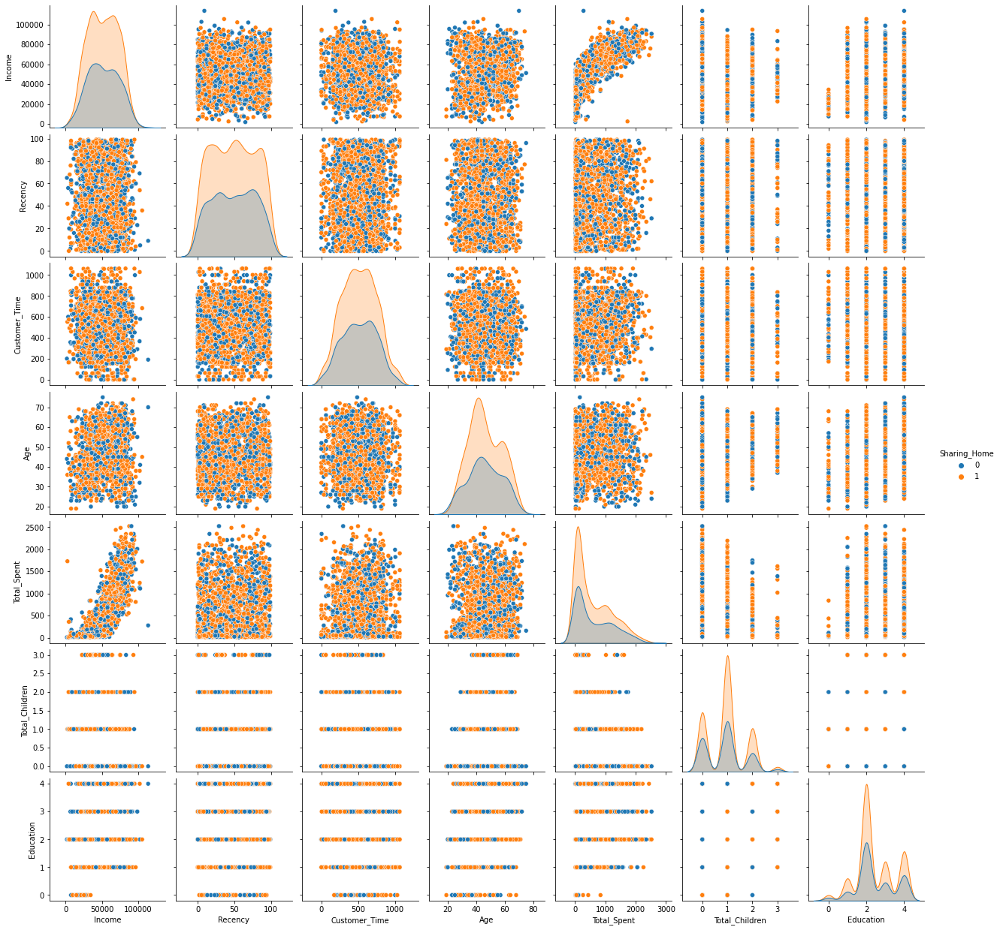

In [25]:
to_plot = [ "Income", "Recency", "Customer_Time", "Age", "Total_Spent", "Total_Children", "Education", "Sharing_Home"]
vis = ["Total_Children", "Education", "Sharing_Home"]
for var in vis:
    plt.figure()
    sns.pairplot(df[to_plot], hue=var)
    plt.show()

Dos gráficos acima, a variável "Total_Children" parece 'clusterizar' os pontos nos gráficos que relacionam Income e Total_Spent. Educação e Sharing_Home não parecem ter esse efeito.

<AxesSubplot:>

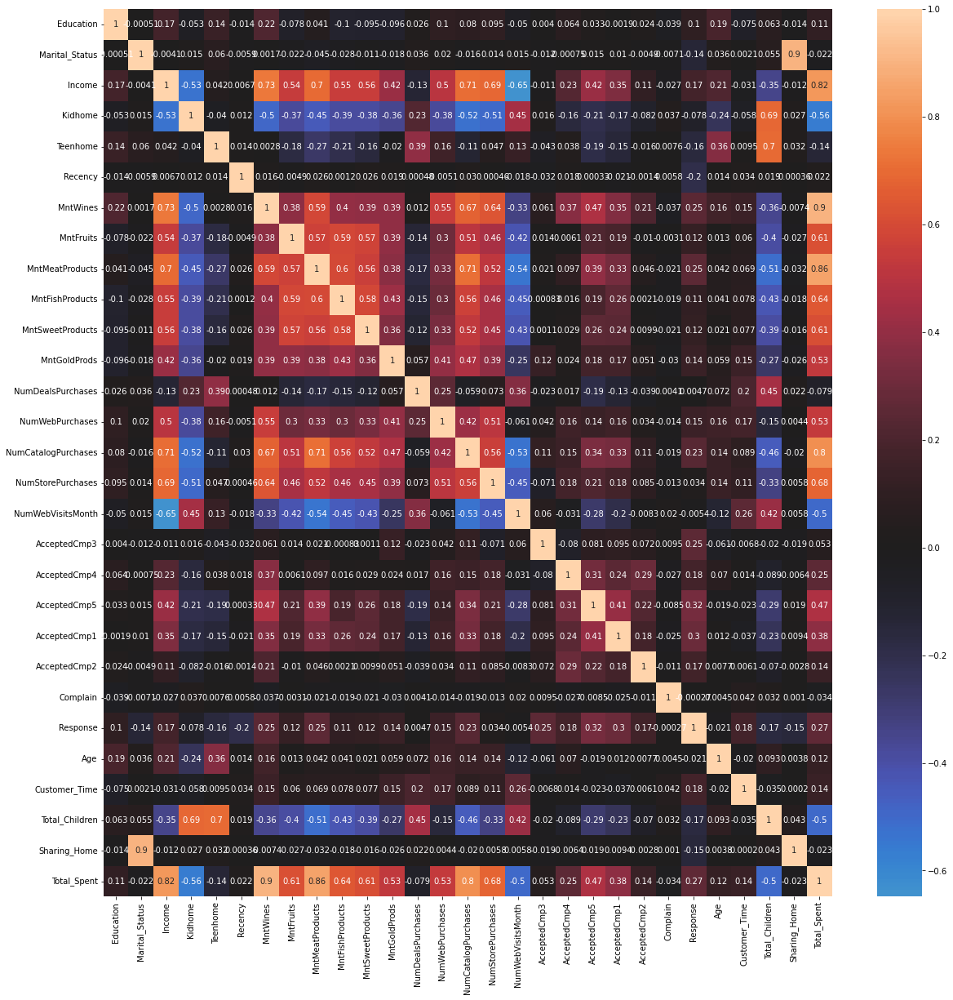

In [26]:
corrmat= df_filtered.corr()
plt.figure(figsize=(20,20))  
sns.heatmap(corrmat,annot=True, center=0)

Analizando a matriz de correlações, parece haver uma relação entre as variáveis:
- Total_Spent e MntWines
- Total_Spent e MntMeatProducts
- Total_Spent e NumCatalogPurchases
- Total_Spent e Income

## Final Dataframe

In [27]:
df_filtered.head()

,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,...,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Age,Customer_Time,Total_Children,Sharing_Home,Total_Spent
0,2,0,58138.0,0,0,58,635,88,546,172,...,0,0,0,0,1,58,971,0,0,1617
1,2,0,46344.0,1,1,38,11,1,6,2,...,0,0,0,0,0,61,125,2,0,27
2,2,3,71613.0,0,0,26,426,49,127,111,...,0,0,0,0,0,50,472,0,1,776
3,2,3,26646.0,1,0,26,11,4,20,10,...,0,0,0,0,0,31,65,1,1,53
4,4,4,58293.0,1,0,94,173,43,118,46,...,0,0,0,0,0,34,321,1,1,422



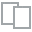
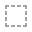
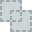
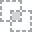
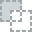
...
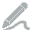
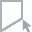
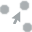
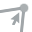
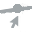

In [28]:
plot(df_filtered)

## Normalizing features

### Shuffle Dataframe

In [29]:
df_filtered = df_filtered.sample(frac = 1)
df_filtered.head()

,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,...,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Age,Customer_Time,Total_Children,Sharing_Home,Total_Spent
95,2,4,30096.0,1,0,30,5,3,11,12,...,0,0,0,0,0,32,198,1,1,45
154,4,3,61010.0,0,1,57,888,0,57,0,...,0,0,0,0,0,63,817,1,1,1021
2101,4,3,67911.0,0,1,63,529,0,356,63,...,0,0,0,0,0,66,198,1,1,976
1872,2,0,44503.0,1,1,83,31,1,8,0,...,0,0,0,0,0,43,234,2,0,48
926,2,4,77583.0,0,0,93,372,23,384,250,...,0,1,0,0,0,37,65,0,1,1149


### Split Train/Test Data

Criando uma coluna no dataframe para representar se a amostra pertence ao grupo de treino ou de teste. O grupo de treino será usado para definir os melhores parâmetros para a clusterização; o grupo de teste será utilizado para avaliar a melhor solução encontrada após a etapa de treinamento.

In [30]:
total_samples = (len(df_filtered.index))
nb_train = int(0.8*total_samples)

split = np.zeros(total_samples)
split[nb_train:] = 1
df_filtered["Split"] = split
df_filtered.head()

,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,...,AcceptedCmp1,AcceptedCmp2,Complain,Response,Age,Customer_Time,Total_Children,Sharing_Home,Total_Spent,Split
95,2,4,30096.0,1,0,30,5,3,11,12,...,0,0,0,0,32,198,1,1,45,0.0
154,4,3,61010.0,0,1,57,888,0,57,0,...,0,0,0,0,63,817,1,1,1021,0.0
2101,4,3,67911.0,0,1,63,529,0,356,63,...,0,0,0,0,66,198,1,1,976,0.0
1872,2,0,44503.0,1,1,83,31,1,8,0,...,0,0,0,0,43,234,2,0,48,0.0
926,2,4,77583.0,0,0,93,372,23,384,250,...,1,0,0,0,37,65,0,1,1149,0.0


Fazendo o split

In [31]:
df_train = df_filtered[df_filtered.Split == 0.0]
df_test = df_filtered[df_filtered.Split == 1.0]
df_train.drop(columns=['Split'], inplace=True)
df_test.drop(columns=['Split'], inplace=True)
print('Dados para treinamento:', len(df_train.index))
print('Dados para teste:', len(df_test.index))

Dados para treinamento: 1764
Dados para teste: 441


/usr/local/lib/python3.7/site-packages/pandas/core/frame.py:4913: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


As colunas do dataframe devem ser normalizadas antes de prosseguir para os testes com o FCM. Para isso, será utilizado o `StandardScaler()`. O fit do scaler deve ser realizado considerando apenas os dados de treinamento. O scaler gerado deve ser reutilizado para normalização dos dados para teste.

In [32]:
from sklearn.preprocessing import StandardScaler

In [33]:
scaler = StandardScaler()
scaler.fit(df_train)
scaled_df_train = pd.DataFrame(scaler.transform(df_train), columns= df_train.columns)
scaled_df_train.head()

,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,...,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Age,Customer_Time,Total_Children,Sharing_Home,Total_Spent
0,-0.430526,0.933767,-1.061335,1.041571,-0.932540,-0.656337,-0.900257,-0.587053,-0.707525,-0.470768,...,-0.27258,-0.259134,-0.1199,-0.101535,-0.408248,-1.203950,-1.329269,0.060706,0.749041,-0.936688
1,1.568023,0.289084,0.453952,-0.823740,0.887151,0.277941,1.787732,-0.662522,-0.492435,-0.690222,...,-0.27258,-0.259134,-0.1199,-0.101535,-0.408248,1.434482,1.307694,0.060706,0.749041,0.715355
2,1.568023,0.289084,0.792213,-0.823740,0.887151,0.485559,0.694880,-0.662522,0.905650,0.461914,...,-0.27258,-0.259134,-0.1199,-0.101535,-0.408248,1.689814,-1.329269,0.060706,0.749041,0.639185
3,-0.430526,-1.644964,-0.355158,1.041571,0.887151,1.177616,-0.821109,-0.637366,-0.721552,-0.690222,...,-0.27258,-0.259134,-0.1199,-0.101535,-0.408248,-0.267732,-1.175908,1.382742,-1.335041,-0.931610
4,-0.430526,0.933767,1.266298,-0.823740,-0.932540,1.523645,0.216948,-0.083926,1.036574,3.881748,...,-0.27258,3.859001,-0.1199,-0.101535,-0.408248,-0.778396,-1.895854,-1.261330,0.749041,0.932017


Os dados de teste serão normalizados com as mesmas estatísticas descritivas dos dados de treino.

In [34]:
scaled_df_test = pd.DataFrame(scaler.transform(df_test), columns= df_test.columns)
scaled_df_test.head()

,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,...,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Age,Customer_Time,Total_Children,Sharing_Home,Total_Spent
0,-0.430526,0.933767,0.121770,-0.823740,0.887151,-0.102691,1.069311,-0.461271,-0.020172,-0.306177,...,-0.27258,-0.259134,-0.1199,-0.101535,-0.408248,-0.693285,0.438646,0.060706,0.749041,0.647649
1,-0.430526,-1.644964,-0.284820,-0.823740,-0.932540,-0.102691,-0.084424,-0.385802,0.073345,0.443626,...,-0.27258,-0.259134,-0.1199,-0.101535,-0.408248,0.668486,0.532367,-1.261330,-1.335041,0.063678
2,0.568748,-1.000281,0.642959,-0.823740,0.887151,-1.382997,0.630953,-0.536740,-0.660766,-0.562207,...,-0.27258,-0.259134,-0.1199,-0.101535,-0.408248,1.604703,-0.835105,0.060706,-1.335041,-0.071735
3,0.568748,0.289084,-1.696193,1.041571,0.887151,1.627454,-0.860683,-0.612209,-0.670118,-0.690222,...,-0.27258,-0.259134,-0.1199,-0.101535,-0.408248,0.753596,-0.920306,1.382742,0.749041,-0.933303
4,-0.430526,0.289084,-0.840566,1.041571,0.887151,-1.417600,-0.309691,0.167638,-0.478407,-0.543919,...,-0.27258,-0.259134,-0.1199,-0.101535,2.449490,-0.182621,0.826309,1.382742,0.749041,-0.474590


In [35]:
df_filtered.drop(columns=['Split'], inplace=True)
scaled_df_filtered = pd.DataFrame(scaler.transform(df_filtered), columns=df_filtered.columns)
scaled_df_filtered.head()

,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,...,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Age,Customer_Time,Total_Children,Sharing_Home,Total_Spent
0,-0.430526,0.933767,-1.061335,1.041571,-0.932540,-0.656337,-0.900257,-0.587053,-0.707525,-0.470768,...,-0.27258,-0.259134,-0.1199,-0.101535,-0.408248,-1.203950,-1.329269,0.060706,0.749041,-0.936688
1,1.568023,0.289084,0.453952,-0.823740,0.887151,0.277941,1.787732,-0.662522,-0.492435,-0.690222,...,-0.27258,-0.259134,-0.1199,-0.101535,-0.408248,1.434482,1.307694,0.060706,0.749041,0.715355
2,1.568023,0.289084,0.792213,-0.823740,0.887151,0.485559,0.694880,-0.662522,0.905650,0.461914,...,-0.27258,-0.259134,-0.1199,-0.101535,-0.408248,1.689814,-1.329269,0.060706,0.749041,0.639185
3,-0.430526,-1.644964,-0.355158,1.041571,0.887151,1.177616,-0.821109,-0.637366,-0.721552,-0.690222,...,-0.27258,-0.259134,-0.1199,-0.101535,-0.408248,-0.267732,-1.175908,1.382742,-1.335041,-0.931610
4,-0.430526,0.933767,1.266298,-0.823740,-0.932540,1.523645,0.216948,-0.083926,1.036574,3.881748,...,-0.27258,3.859001,-0.1199,-0.101535,-0.408248,-0.778396,-1.895854,-1.261330,0.749041,0.932017


# Fuzzy C Means: Clustering

In [36]:
data_train = scaled_df_train.to_numpy()
data_test = scaled_df_test.to_numpy()

In [37]:
n_clusters_list = np.arange(2, 15)
n_clusters_list

array([ 2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14])

In [38]:
eps = 1e-9

## Baseline: Raw data

In [39]:
m_1 = m_estimate(data_train)
print('Estimated m:', m_1)

Estimated m: 1.0885862106593263


In [40]:
models_1 = list()
for n_clusters in n_clusters_list:
    fcm = FCM(n_clusters = n_clusters, m = m_1, error=eps)
    fcm.fit(data_train)
    models_1.append(fcm)

In [41]:
pc_list_1, pec_list_1, fcm_centers_1, fcm_labels_1, fcm_soft_labels_1 = apply_fcm_test(n_clusters_list, models_1, data_train)

n_clusters = 2, PC = 0.482, PEC = 0.044
n_clusters = 3, PC = 0.309, PEC = 0.060
n_clusters = 4, PC = 0.225, PEC = 0.066
n_clusters = 5, PC = 0.183, PEC = 0.045
n_clusters = 6, PC = 0.149, PEC = 0.047
n_clusters = 7, PC = 0.125, PEC = 0.047
n_clusters = 8, PC = 0.108, PEC = 0.045
n_clusters = 9, PC = 0.098, PEC = 0.036
n_clusters = 10, PC = 0.087, PEC = 0.037
n_clusters = 11, PC = 0.080, PEC = 0.032
n_clusters = 12, PC = 0.074, PEC = 0.025
n_clusters = 13, PC = 0.069, PEC = 0.022
n_clusters = 14, PC = 0.064, PEC = 0.021


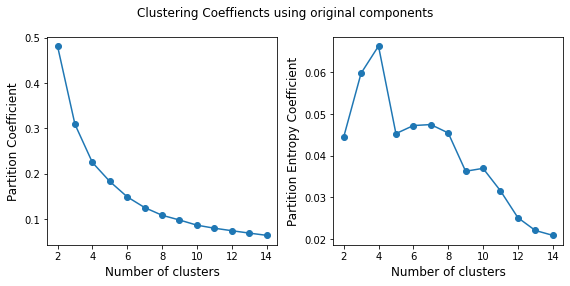

In [42]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=plt.figaspect(0.5))
fig.suptitle('Clustering Coeffiencts using original components')
ax1.plot(n_clusters_list, pc_list_1, marker="o")
ax1.set_xlabel('Number of clusters', fontsize=12)
ax1.set_ylabel('Partition Coefficient', fontsize=12)
ax2.plot(n_clusters_list, pec_list_1, marker="o")
ax2.set_xlabel('Number of clusters', fontsize=12)
ax2.set_ylabel('Partition Entropy Coefficient', fontsize=12)
fig.tight_layout(pad=1)
plt.show()

## PCA + FCM

### PCA: 2 principal components (p = 2)

In [43]:
p = 2 

In [44]:
reduced_df_train_2, pca_2 = apply_pca(data_train, number_components=p)
reduced_df_test_2, _ = apply_pca(data_test, number_components=p, pca_fitted=pca_2)
pca_2.explained_variance_ratio_

     count          mean       std       min       25%       50%       75%  \
c0  1764.0  8.773531e-17  2.850577 -4.601694 -2.555253 -0.806830  2.374574   
c1  1764.0  1.598620e-17  1.586679 -3.577620 -1.248963 -0.171419  1.099425   

         max  
c0  7.896033  
c1  5.755853  
Fitting data using provided PCA object.
    count      mean       std       min       25%       50%       75%  \
c0  441.0  0.078012  2.986484 -5.546978 -2.557377 -0.737695  2.465284   
c1  441.0  0.002304  1.438583 -3.268590 -1.185870 -0.137450  1.071628   

         max  
c0  8.599288  
c1  4.034478  


array([0.28004072, 0.08676289])

In [45]:
m_2 = m_estimate(reduced_df_train_2)
print('Estimated m:', m_2)

Estimated m: 6.900714330982995


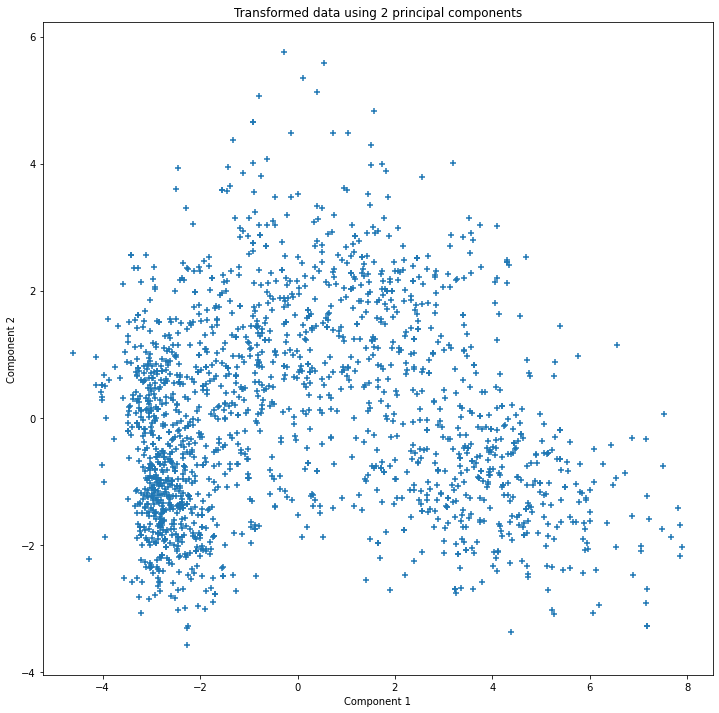

In [46]:
fig = plt.figure(figsize=(12,12))
plt.scatter(reduced_df_train_2[reduced_df_train_2.columns[0]], reduced_df_train_2[reduced_df_train_2.columns[1]], marker="+")
plt.title('Transformed data using %d principal components' % p)
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.show()

In [47]:
reduced_df_np_2 = reduced_df_train_2.to_numpy()
reduced_df_np_test_2 = reduced_df_test_2.to_numpy()

In [48]:
models_2 = list()
for n_clusters in n_clusters_list:
    fcm = FCM(n_clusters = n_clusters, m = m_2, error=eps)
    fcm.fit(reduced_df_np_2)
    models_2.append(fcm)

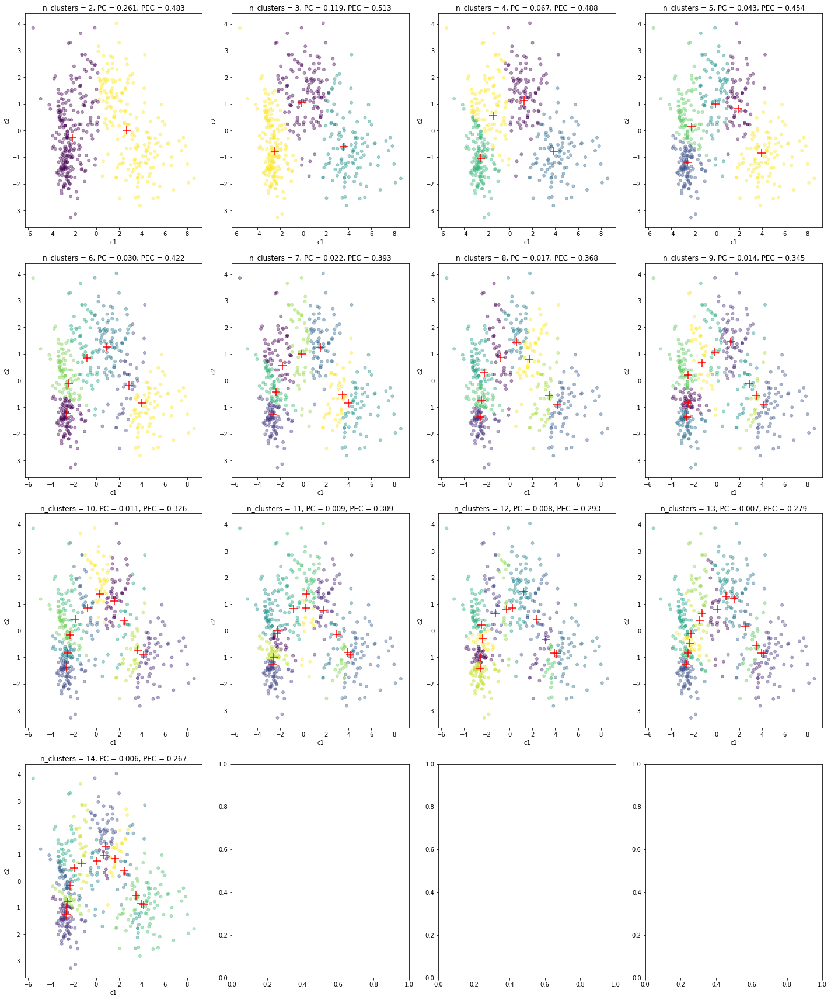

In [49]:
pc_list_2, pec_list_2, fcm_centers_2, fcm_labels_2, fcm_soft_labels_2 = apply_fcm_test(n_clusters_list, models_2, reduced_df_np_test_2)

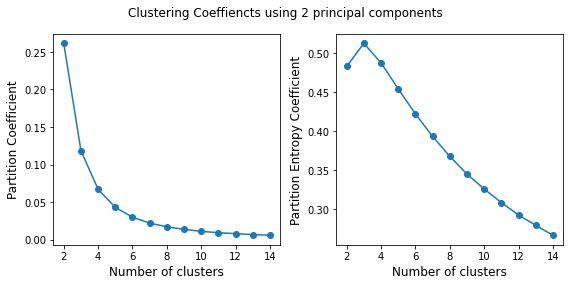

In [50]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=plt.figaspect(0.5))
fig.suptitle('Clustering Coeffiencts using %d principal components' % p)
ax1.plot(n_clusters_list, pc_list_2, marker="o")
ax1.set_xlabel('Number of clusters', fontsize=12)
ax1.set_ylabel('Partition Coefficient', fontsize=12)
ax2.plot(n_clusters_list, pec_list_2, marker="o")
ax2.set_xlabel('Number of clusters', fontsize=12)
ax2.set_ylabel('Partition Entropy Coefficient', fontsize=12)
fig.tight_layout(pad=1)
plt.show()

### PCA:  3 principal components (p = 3)

In [51]:
p = 3

In [52]:
reduced_df_train_3, pca_3 = apply_pca(data_train, number_components=p)
reduced_df_test_3, _ = apply_pca(data_test, number_components=p, pca_fitted=pca_3)

     count          mean       std       min       25%       50%       75%  \
c0  1764.0 -2.391637e-18  2.850577 -4.601697 -2.555252 -0.806828  2.374572   
c1  1764.0  8.886819e-17  1.586678 -3.576371 -1.249341 -0.171688  1.100565   
c2  1764.0  2.467162e-17  1.416203 -3.167743 -1.016137 -0.303678  0.930057   

         max  
c0  7.896036  
c1  5.754111  
c2  6.861407  
Fitting data using provided PCA object.
    count      mean       std       min       25%       50%       75%  \
c0  441.0  0.078012  2.986484 -5.546988 -2.557376 -0.737691  2.465288   
c1  441.0  0.002130  1.438541 -3.268001 -1.185120 -0.142108  1.076847   
c2  441.0  0.075489  1.435969 -2.736630 -0.938045 -0.288230  1.069882   

         max  
c0  8.599295  
c1  4.032944  
c2  5.119058  


In [53]:
m_3 = m_estimate(reduced_df_train_3)
print('Estimated m:', m_3)

Estimated m: 3.6974460233452553


In [54]:
pca_3.explained_variance_ratio_

array([0.28004072, 0.08676219, 0.0691061 ])

/Users/amanda/Library/Python/3.7/lib/python/site-packages/ipykernel_launcher.py:2: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  


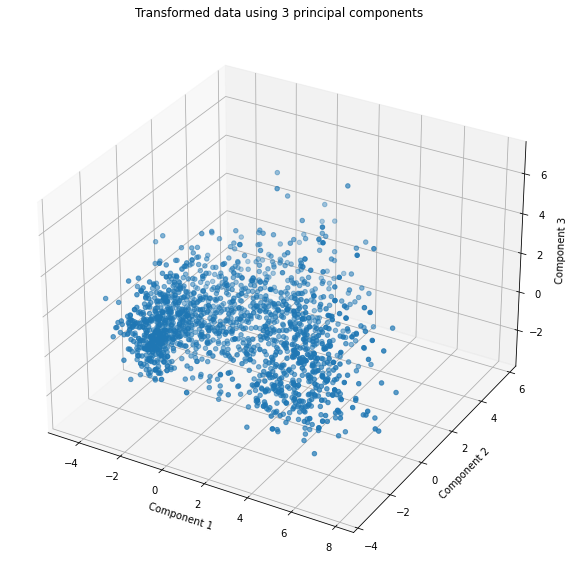

In [55]:
fig = plt.figure(figsize=(10,10))
ax = fig.gca(projection='3d')
#ax = fig.add_subplot(111, projection="3d")
ax.scatter(reduced_df_train_3[reduced_df_train_3.columns[0]], reduced_df_train_3[reduced_df_train_3.columns[1]], reduced_df_train_3[reduced_df_train_3.columns[2]], marker="o")
ax.set_title('Transformed data using %d principal components' % p)
ax.set_xlabel('Component 1')
ax.set_ylabel('Component 2')
ax.set_zlabel('Component 3')
plt.show()

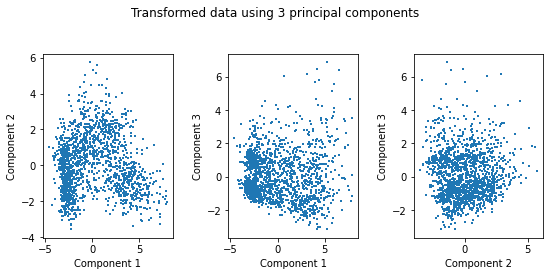

In [56]:
fig, axs = plt.subplots(1, 3, figsize=plt.figaspect(0.5)) #figsize=(18, 9))
fig.suptitle('Transformed data using %d principal components' % p)
axs[0].scatter(reduced_df_train_3[reduced_df_train_3.columns[0]], reduced_df_train_3[reduced_df_train_3.columns[1]], marker="+", s=3)
axs[0].set_xlabel('Component 1')
axs[0].set_ylabel('Component 2')
axs[1].scatter(reduced_df_train_3[reduced_df_train_3.columns[0]], reduced_df_train_3[reduced_df_train_3.columns[2]], marker="+", s=3)
axs[1].set_xlabel('Component 1')
axs[1].set_ylabel('Component 3')
axs[2].scatter(reduced_df_train_3[reduced_df_train_3.columns[1]], reduced_df_train_3[reduced_df_train_3.columns[2]], marker="+", s=3)
axs[2].set_xlabel('Component 2')
axs[2].set_ylabel('Component 3')
fig.tight_layout(pad=2)
plt.show()

In [57]:
reduced_df_np_3 = reduced_df_train_3.to_numpy()
reduced_df_np_test_3 = reduced_df_test_3.to_numpy()
models_3 = list()
for n_clusters in n_clusters_list:
    fcm = FCM(n_clusters = n_clusters, m = m_3, error=eps)
    fcm.fit(reduced_df_np_3)
    models_3.append(fcm)

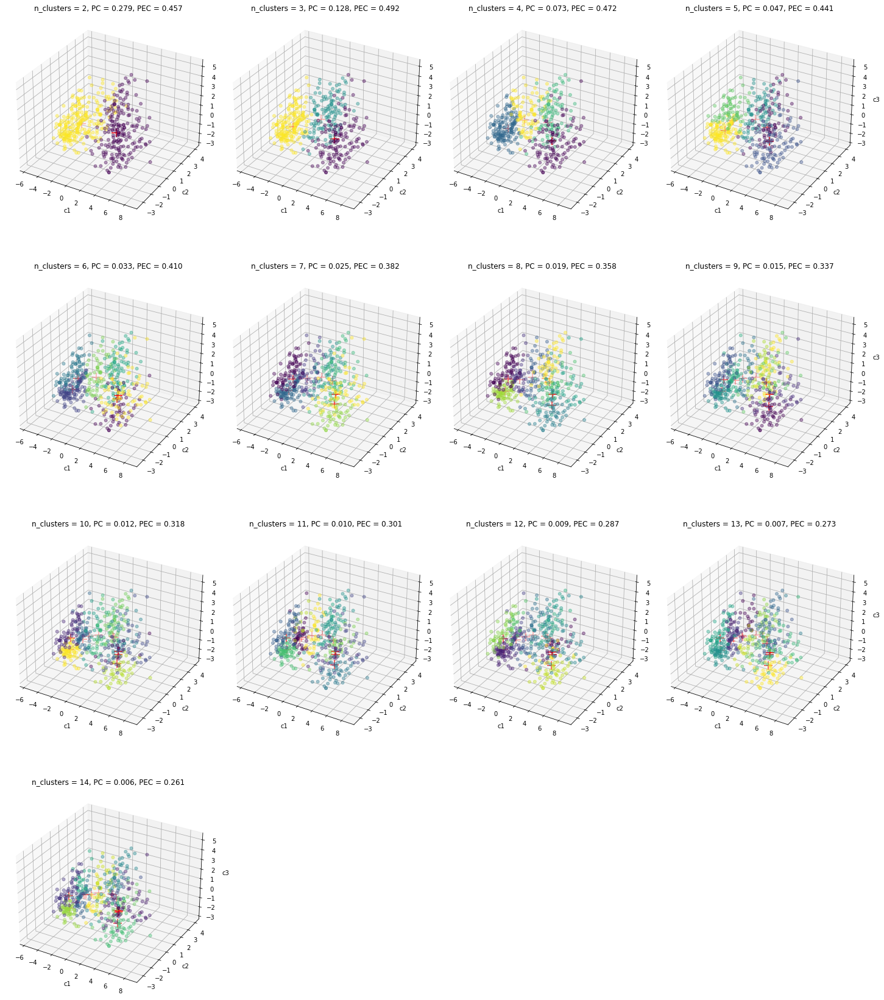

In [58]:
pc_list_3, pec_list_3, fcm_centers_3, fcm_labels_3, fcm_soft_labels_3 = apply_fcm_test(n_clusters_list, models_3, reduced_df_np_test_3)

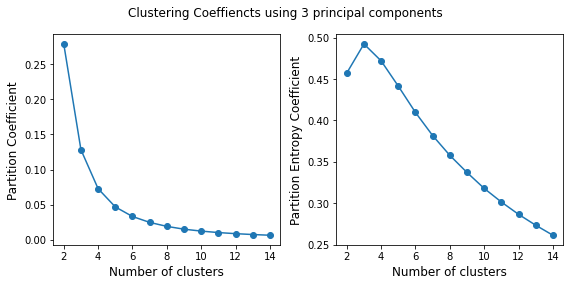

In [59]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=plt.figaspect(0.5))
fig.suptitle('Clustering Coeffiencts using %d principal components' % p)
ax1.plot(n_clusters_list, pc_list_3, marker="o")
ax1.set_xlabel('Number of clusters', fontsize=12)
ax1.set_ylabel('Partition Coefficient', fontsize=12)
ax2.plot(n_clusters_list, pec_list_3, marker="o")
ax2.set_xlabel('Number of clusters', fontsize=12)
ax2.set_ylabel('Partition Entropy Coefficient', fontsize=12)
fig.tight_layout(pad=1)
plt.show()

###  PCA:  Using 5 principal components (p = 5)

In [60]:
p = 5

In [61]:
reduced_df_train_5, pca_5 = apply_pca(data_train, number_components=p)
reduced_df_test_5, _ = apply_pca(data_test, number_components=p, pca_fitted=pca_5)

     count          mean       std       min       25%       50%       75%  \
c0  1764.0 -7.955340e-17  2.850577 -4.601696 -2.555253 -0.806829  2.374575   
c1  1764.0  8.484017e-17  1.586679 -3.577744 -1.249103 -0.171573  1.099161   
c2  1764.0 -3.524518e-18  1.416302 -3.152074 -1.020199 -0.308049  0.927221   
c3  1764.0 -2.523806e-17  1.343319 -3.946763 -0.980583  0.111144  0.786332   
c4  1764.0  1.334282e-17  1.282109 -3.564422 -0.909243 -0.002445  0.823940   

         max  
c0  7.896033  
c1  5.755722  
c2  6.864044  
c3  6.924614  
c4  4.726972  
Fitting data using provided PCA object.
    count      mean       std       min       25%       50%       75%  \
c0  441.0  0.078012  2.986484 -5.546980 -2.557377 -0.737695  2.465283   
c1  441.0  0.002322  1.438605 -3.268331 -1.186261 -0.137807  1.071589   
c2  441.0  0.077736  1.436688 -2.726807 -0.937641 -0.291201  1.071678   
c3  441.0  0.130842  1.448875 -3.163176 -0.903576  0.233787  0.879654   
c4  441.0  0.060404  1.246635 -2.769

In [62]:
m_5 = m_estimate(reduced_df_train_5)
print('Estimated m:', m_5)

Estimated m: 2.0419517499444746


In [63]:
pca_5.explained_variance_ratio_

array([0.28004072, 0.08676284, 0.06912971, 0.06218837, 0.05664971])

In [64]:
reduced_df_np_5 = reduced_df_train_5.to_numpy()
reduced_df_np_test_5 = reduced_df_test_5.to_numpy()
models_5 = list()
for n_clusters in n_clusters_list:
    fcm = FCM(n_clusters = n_clusters, m = m_5, error=eps)
    fcm.fit(reduced_df_np_5)
    models_5.append(fcm)

In [65]:
pc_list_5, pec_list_5, fcm_centers_5, fcm_labels_5, fcm_soft_labels_5 = apply_fcm_test(n_clusters_list, models_5, reduced_df_np_test_5)

n_clusters = 2, PC = 0.337, PEC = 0.362
n_clusters = 3, PC = 0.164, PEC = 0.414
n_clusters = 4, PC = 0.098, PEC = 0.404
n_clusters = 5, PC = 0.068, PEC = 0.376
n_clusters = 6, PC = 0.052, PEC = 0.345
n_clusters = 7, PC = 0.041, PEC = 0.323
n_clusters = 8, PC = 0.032, PEC = 0.305
n_clusters = 9, PC = 0.026, PEC = 0.289
n_clusters = 10, PC = 0.022, PEC = 0.272
n_clusters = 11, PC = 0.019, PEC = 0.258
n_clusters = 12, PC = 0.016, PEC = 0.246
n_clusters = 13, PC = 0.014, PEC = 0.235
n_clusters = 14, PC = 0.012, PEC = 0.226


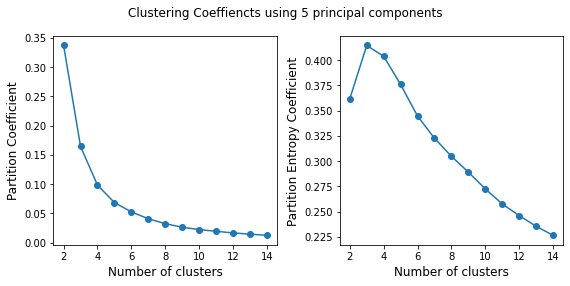

In [66]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=plt.figaspect(0.5))
fig.suptitle('Clustering Coeffiencts using %d principal components' % p)
ax1.plot(n_clusters_list, pc_list_5, marker="o")
ax1.set_xlabel('Number of clusters', fontsize=12)
ax1.set_ylabel('Partition Coefficient', fontsize=12)
ax2.plot(n_clusters_list, pec_list_5, marker="o")
ax2.set_xlabel('Number of clusters', fontsize=12)
ax2.set_ylabel('Partition Entropy Coefficient', fontsize=12)
fig.tight_layout(pad=1)
plt.show()

### Comparing PC and PE for different values of principal components

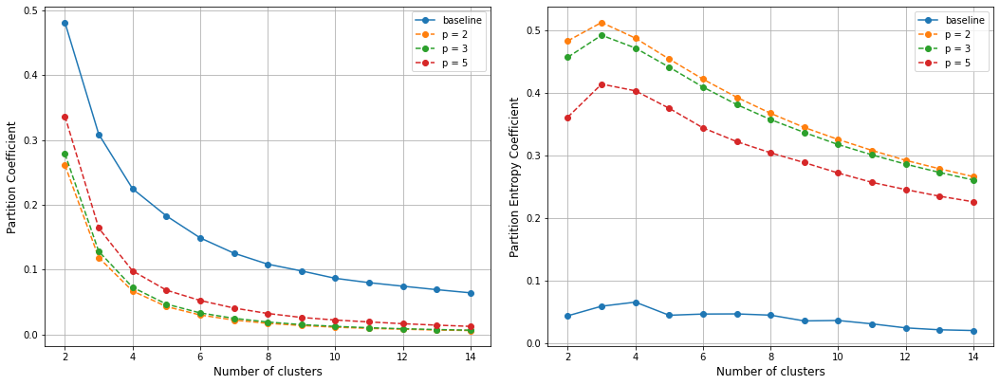

In [67]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,6))#figsize=plt.figaspect(0.5))
ax1.plot(n_clusters_list, pc_list_1, marker="o", label='baseline')
ax1.plot(n_clusters_list, pc_list_2, marker="o", label='p = 2', linestyle ="--")
ax1.plot(n_clusters_list, pc_list_3, marker="o", label='p = 3', linestyle ="--")
ax1.plot(n_clusters_list, pc_list_5, marker="o", label='p = 5', linestyle ="--")
ax1.set_xlabel('Number of clusters', fontsize=12)
ax1.set_ylabel('Partition Coefficient', fontsize=12)
ax1.legend()
ax1.grid(True)
ax2.plot(n_clusters_list, pec_list_1, marker="o", label='baseline')
ax2.plot(n_clusters_list, pec_list_2, marker="o", label='p = 2', linestyle ="--")
ax2.plot(n_clusters_list, pec_list_3, marker="o", label='p = 3', linestyle ="--")
ax2.plot(n_clusters_list, pec_list_5, marker="o", label='p = 5', linestyle ="--")
ax2.set_xlabel('Number of clusters', fontsize=12)
ax2.set_ylabel('Partition Entropy Coefficient', fontsize=12)
ax2.legend()
fig.tight_layout(pad=2)
ax2.grid(True)
plt.show()

Os melhores valores de PC e PEC foram obtidos com os dados originais. Para gerar uma comparação com o baseline, foi escolhido o método que utiliza 3 componentes principais, por questão de facilitar a visualização e não apresentar resultado tão inferior quanto o que mais se aproxima do baseline -- p = 5. Analisando as curvas, um bom número de clusters para esse conjunto de dados parece ser c = 2 ou c = 4. 

## EXPERIMENTO 1: Usando c = 2 (Baseline e PCA, p = 3)

In [68]:
df_filtered_ = df_filtered.copy()

Selecionando os modelos para os quais c = 2:

In [69]:
best_model_1 = models_1[0]
best_model_3 = models_3[0]
models = [best_model_1, best_model_3]
n_clusters = 2
fcm_soft_labels_list = []
fcm_hard_labels_list = []

Aplicando os modelos em todo o conjunto de treinamento.

In [70]:
# conjunto completo com todas as componentes
scaled_df_array = scaled_df_filtered.to_numpy()
# aplicando o PCA fitado nos dados de treino com p = 5 no df inteiro:
reduced_df_array_3 = apply_pca(scaled_df_filtered, number_components=3, pca_fitted=pca_3)[0].to_numpy()
scaled_df_array.shape, reduced_df_array_3.shape

Fitting data using provided PCA object.
     count      mean       std       min       25%       50%       75%  \
c0  2205.0  0.015602  2.877750 -5.546988 -2.556899 -0.803906  2.379458   
c1  2205.0  0.000426  1.557863 -3.576371 -1.231880 -0.156680  1.099687   
c2  2205.0  0.015098  1.420172 -3.167743 -1.007000 -0.301951  0.950309   

         max  
c0  8.599295  
c1  5.754111  
c2  6.861407  


/usr/local/lib/python3.7/site-packages/sklearn/base.py:439: UserWarning: X has feature names, but PCA was fitted without feature names
  f"X has feature names, but {self.__class__.__name__} was fitted without"
/usr/local/lib/python3.7/site-packages/sklearn/base.py:439: UserWarning: X has feature names, but PCA was fitted without feature names
  f"X has feature names, but {self.__class__.__name__} was fitted without"


((2205, 29), (2205, 3))

In [71]:
dfs_list = [scaled_df_array, reduced_df_array_3]

In [72]:
# conjunto completo com todas as componentes
scaled_df_array = scaled_df_filtered.to_numpy()
# aplicando o PCA fitado nos dados de treino com p = 5 no df inteiro:
reduced_df_array_3 = apply_pca(scaled_df_filtered, number_components=3, pca_fitted=pca_3)[0].to_numpy()
scaled_df_array.shape, reduced_df_array_3.shape

Fitting data using provided PCA object.
     count      mean       std       min       25%       50%       75%  \
c0  2205.0  0.015602  2.877750 -5.546988 -2.556899 -0.803906  2.379458   
c1  2205.0  0.000426  1.557863 -3.576371 -1.231880 -0.156680  1.099687   
c2  2205.0  0.015098  1.420172 -3.167743 -1.007000 -0.301951  0.950309   

         max  
c0  8.599295  
c1  5.754111  
c2  6.861407  


/usr/local/lib/python3.7/site-packages/sklearn/base.py:439: UserWarning: X has feature names, but PCA was fitted without feature names
  f"X has feature names, but {self.__class__.__name__} was fitted without"
/usr/local/lib/python3.7/site-packages/sklearn/base.py:439: UserWarning: X has feature names, but PCA was fitted without feature names
  f"X has feature names, but {self.__class__.__name__} was fitted without"


((2205, 29), (2205, 3))

In [73]:
for (i, model, df) in zip([1, 2], models, dfs_list):
    print('i:', i)
    pc = model.partition_coefficient
    pec = model.partition_entropy_coefficient
    fcm_centers = model.centers
    fcm_labels = model.predict(df)
    fcm_hard_labels_list.append(fcm_labels)
    fcm_soft_labels = model.soft_predict(df)
    fcm_soft_labels_list.append(fcm_soft_labels)
    print(f'n_clusters = {n_clusters}, PC = {pc:.3f}, PEC = {pec:.3f}')

i: 1
n_clusters = 2, PC = 0.482, PEC = 0.044
i: 2
n_clusters = 2, PC = 0.279, PEC = 0.457


O primeiro passo é combinar as saídas obtidas com os dados originais.

In [74]:
cluster_1 = fcm_soft_labels_list[0][:,0]
cluster_2 = fcm_soft_labels_list[0][:,1]
cluster_label = fcm_hard_labels_list[0]
df_filtered_["c1"] = cluster_1
df_filtered_["c2"] = cluster_2
df_filtered_["ch"] = cluster_label

In [75]:
cluster_1 = fcm_soft_labels_list[1][:,0]
cluster_2 = fcm_soft_labels_list[1][:,1]
cluster_label = fcm_hard_labels_list[1]
df_filtered_["c1_pca"] = cluster_1
df_filtered_["c2_pca"] = cluster_2
df_filtered_["ch_pca"] = cluster_label
df_filtered_.head()

,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,...,Customer_Time,Total_Children,Sharing_Home,Total_Spent,c1,c2,ch,c1_pca,c2_pca,ch_pca
95,2,4,30096.0,1,0,30,5,3,11,12,...,198,1,1,45,5.478738e-09,1.000000,1,0.314093,0.685907,1
154,4,3,61010.0,0,1,57,888,0,57,0,...,817,1,1,1021,9.889809e-01,0.011019,0,0.575587,0.424413,0
2101,4,3,67911.0,0,1,63,529,0,356,63,...,198,1,1,976,9.991519e-01,0.000848,0,0.630270,0.369730,0
1872,2,0,44503.0,1,1,83,31,1,8,0,...,234,2,0,48,3.826213e-08,1.000000,1,0.273242,0.726758,1
926,2,4,77583.0,0,0,93,372,23,384,250,...,65,0,1,1149,9.992127e-01,0.000787,0,0.643790,0.356210,0


In [76]:
df_filtered_.ch.value_counts()

1    1342
0     863
Name: ch, dtype: int64

In [77]:
df_filtered_.ch_pca.value_counts()

1    1288
0     917
Name: ch_pca, dtype: int64

<AxesSubplot:xlabel='ch_pca', ylabel='count'>

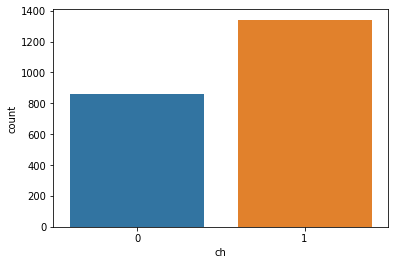

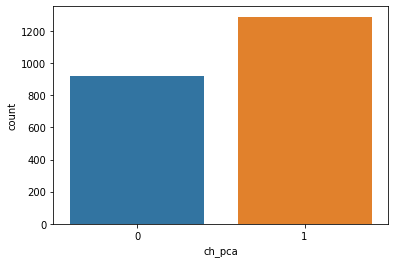

In [78]:
sns.countplot(x=df_filtered_["ch"])
plt.figure()
sns.countplot(x=df_filtered_["ch_pca"])

In [79]:
print('Número de amostras classificadas igualmente para o experimento baseline e o usando PCA:', np.sum(df_filtered_["ch"] == df_filtered_["ch_pca"]), 'de um total de', len(df_filtered_.index))
print('Apenas', str(len(df_filtered_.index) - np.sum(df_filtered_["ch"] == df_filtered_["ch_pca"])), 'foram classificadas diferente.')

Número de amostras classificadas igualmente para o experimento baseline e o usando PCA: 2151 de um total de 2205
Apenas 54 foram classificadas diferente.


O agrupamento realizado usando componantes principais parece ter concentrado mais itens em um cluster, quando comparado aos demais do mesmo experimento. Já para os dados originais, a diferença entre o número de itens do menor e maior clusters é menor.

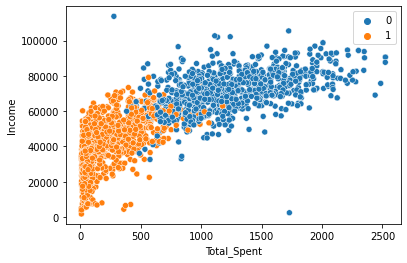

In [80]:
sns.scatterplot(data = df_filtered_, x=df_filtered_["Total_Spent"], y=df_filtered_["Income"], hue=df_filtered_["ch"])
plt.legend()

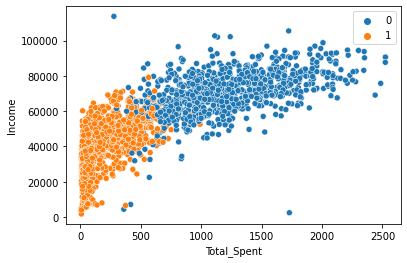

In [81]:
sns.scatterplot(data = df_filtered_, x=df_filtered_["Total_Spent"], y=df_filtered_["Income"], hue=df_filtered_["ch_pca"])
plt.legend()

Apesar da diferença notada ao rodar o comando `value_counts`, os dois experimentos tem resultados parecidos ao se realizar uma comparação visual dos clusters resultantes.

### Looking closely at the soft clustering

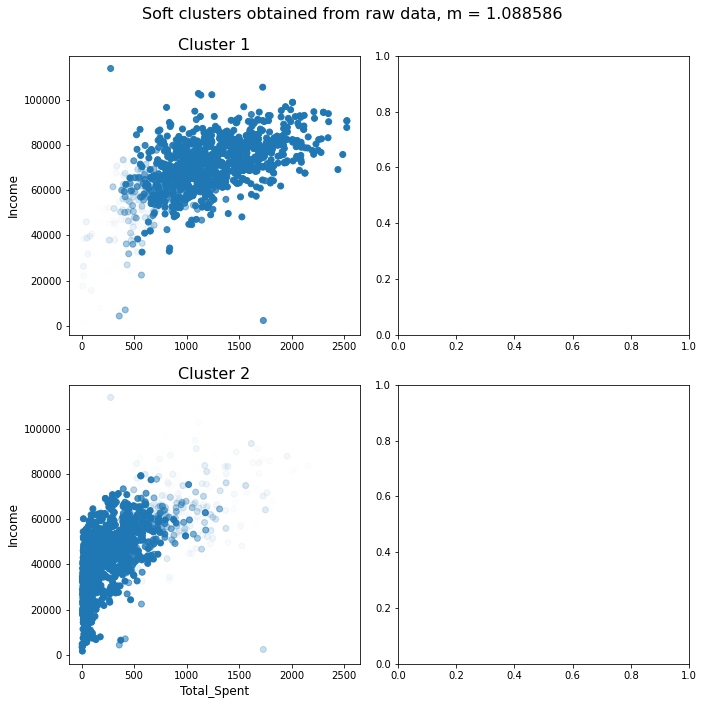

In [82]:
fig, (ax1, ax2) = plt.subplots(2, 2, figsize=(10,10))
plt.suptitle('Soft clusters obtained from raw data, m = %f' % models[0].m, fontsize=16)
ax1[0].scatter(df_filtered_["Total_Spent"], df_filtered_["Income"], alpha=df_filtered_['c1'], label='cluster 1')
ax1[0].set_ylabel('Income', fontsize=12)
ax1[0].set_title('Cluster 1', fontsize=16)
ax2[0].scatter(df_filtered_["Total_Spent"], df_filtered_["Income"], alpha=df_filtered_['c2'], label='cluster 2')
ax2[0].set_xlabel('Total_Spent', fontsize=12)
ax2[0].set_ylabel('Income', fontsize=12)
ax2[0].set_title('Cluster 2', fontsize=16)
# ax1[1].scatter(df_filtered_["Total_Spent"], df_filtered_["Income"], alpha=df_filtered_['c_3'], label='cluster 3')
# ax1[1].set_title('Cluster 3', fontsize=16)
# ax2[1].scatter(df_filtered_["Total_Spent"], df_filtered_["Income"], alpha=df_filtered_['c_4'], label='cluster 4')
# ax2[1].set_xlabel('Total_Spent', fontsize=12)
# ax2[1].set_title('Cluster 4', fontsize=16)
fig.tight_layout(pad=1.5)
plt.show()

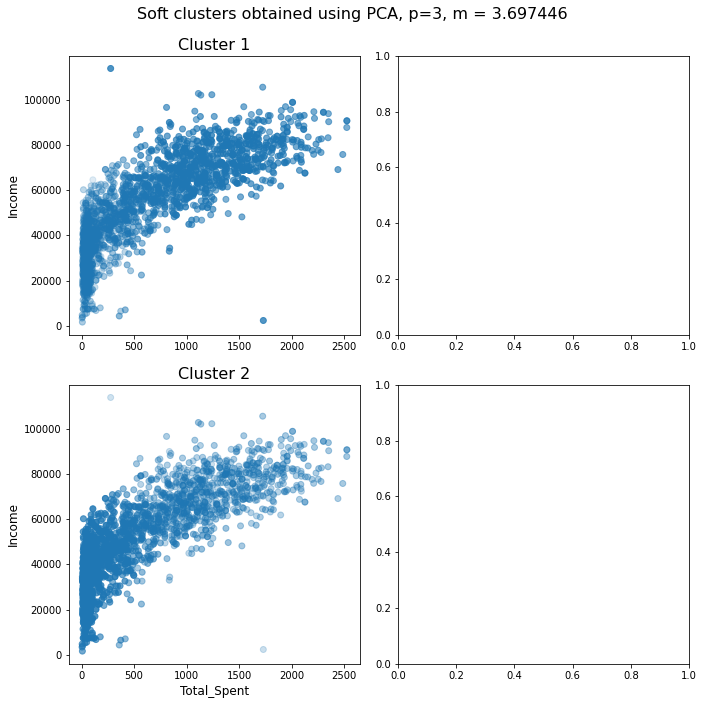

In [83]:
fig, (ax1, ax2) = plt.subplots(2, 2, figsize=(10,10))
plt.suptitle('Soft clusters obtained using PCA, p=3, m = %f' % models[1].m, fontsize=16)
ax1[0].scatter(df_filtered_["Total_Spent"], df_filtered_["Income"], alpha=df_filtered_['c1_pca'])
ax1[0].set_ylabel('Income', fontsize=12)
ax1[0].set_title('Cluster 1', fontsize=16)
ax2[0].scatter(df_filtered_["Total_Spent"], df_filtered_["Income"], alpha=df_filtered_['c2_pca'])
ax2[0].set_xlabel('Total_Spent', fontsize=12)
ax2[0].set_ylabel('Income', fontsize=12)
ax2[0].set_title('Cluster 2', fontsize=16)
# ax1[1].scatter(df_filtered_["Total_Spent"], df_filtered_["Income"], alpha=df_filtered_['c_3_pca'])
# ax1[1].set_title('Cluster 3', fontsize=16)
# ax2[1].scatter(df_filtered_["Total_Spent"], df_filtered_["Income"], alpha=df_filtered_['c_4_pca'])
# ax2[1].set_xlabel('Total_Spent', fontsize=12)
# ax2[1].set_title('Cluster 4', fontsize=16)
fig.tight_layout(pad=1.5)
plt.show()

In [84]:
models[0].m, models[1].m

(1.0885862106593263, 3.6974460233452553)

## *** EXPERIMENTO 2: Usando c = 4 (Baseline e PCA, p = 3)

Selecionando os modelos para os quais c = 4:

In [85]:
# Os modelos para os quais c = 4 são correspondetes à terceira posição na lista de modelos fitados para cada experimento.
best_model_1 = models_1[2]
best_model_3 = models_3[2]
models = [best_model_1, best_model_3]
n_clusters = 4
fcm_soft_labels_list = []
fcm_hard_labels_list = []

Aplicando os modelos em todo o conjunto de treinamento (obs.: visualização utilizando apenas as três primeiras componentes):

In [86]:
# conjunto completo com todas as componentes
scaled_df_array = scaled_df_filtered.to_numpy()
# aplicando o PCA fitado nos dados de treino com p = 5 no df inteiro:
reduced_df_array_3 = apply_pca(scaled_df_filtered, number_components=3, pca_fitted=pca_3)[0].to_numpy()
scaled_df_array.shape, reduced_df_array_3.shape

Fitting data using provided PCA object.
     count      mean       std       min       25%       50%       75%  \
c0  2205.0  0.015602  2.877750 -5.546988 -2.556899 -0.803906  2.379458   
c1  2205.0  0.000426  1.557863 -3.576371 -1.231880 -0.156680  1.099687   
c2  2205.0  0.015098  1.420172 -3.167743 -1.007000 -0.301951  0.950309   

         max  
c0  8.599295  
c1  5.754111  
c2  6.861407  


/usr/local/lib/python3.7/site-packages/sklearn/base.py:439: UserWarning: X has feature names, but PCA was fitted without feature names
  f"X has feature names, but {self.__class__.__name__} was fitted without"
/usr/local/lib/python3.7/site-packages/sklearn/base.py:439: UserWarning: X has feature names, but PCA was fitted without feature names
  f"X has feature names, but {self.__class__.__name__} was fitted without"


((2205, 29), (2205, 3))

In [87]:
dfs_list = [scaled_df_array, reduced_df_array_3]

In [88]:
for (i, model, df) in zip([1, 2], models, dfs_list):
    print('i:', i)
    pc = model.partition_coefficient
    pec = model.partition_entropy_coefficient
    fcm_centers = model.centers
    fcm_labels = model.predict(df)
    fcm_hard_labels_list.append(fcm_labels)
    fcm_soft_labels = model.soft_predict(df)
    fcm_soft_labels_list.append(fcm_soft_labels)
    print(f'n_clusters = {n_clusters}, PC = {pc:.3f}, PEC = {pec:.3f}')

i: 1
n_clusters = 4, PC = 0.225, PEC = 0.066
i: 2
n_clusters = 4, PC = 0.073, PEC = 0.472


O primeiro passo é combinar as saídas obtidas com os dados originais.

In [89]:
df_filtered_ = df_filtered.copy()

In [90]:
cluster_0 = fcm_soft_labels_list[0][:,0]
cluster_1 = fcm_soft_labels_list[0][:,1]
cluster_2 = fcm_soft_labels_list[0][:,2]
cluster_3 = fcm_soft_labels_list[0][:,3]
cluster_label = fcm_hard_labels_list[0]
df_filtered_["fuzzy_c0"] = cluster_0
df_filtered_["fuzzy_c1"] = cluster_1
df_filtered_["fuzzy_c2"] = cluster_2
df_filtered_["fuzzy_c3"] = cluster_3
df_filtered_["fuzzy_ch"] = cluster_label

In [91]:
cluster_0 = fcm_soft_labels_list[1][:,0]
cluster_1 = fcm_soft_labels_list[1][:,1]
cluster_2 = fcm_soft_labels_list[1][:,2]
cluster_3 = fcm_soft_labels_list[1][:,3]
cluster_label = fcm_hard_labels_list[1]
df_filtered_["fuzzy_c0_pca"] = cluster_0
df_filtered_["fuzzy_c1_pca"] = cluster_1
df_filtered_["fuzzy_c2_pca"] = cluster_2
df_filtered_["fuzzy_c3_pca"] = cluster_3
df_filtered_["fuzzy_ch_pca"] = cluster_label
df_filtered_.head()

,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,...,fuzzy_c0,fuzzy_c1,fuzzy_c2,fuzzy_c3,fuzzy_ch,fuzzy_c0_pca,fuzzy_c1_pca,fuzzy_c2_pca,fuzzy_c3_pca,fuzzy_ch_pca
95,2,4,30096.0,1,0,30,5,3,11,12,...,4.277733e-09,7.915957e-12,1.000000,3.729228e-08,2,0.134922,0.439894,0.166979,0.258205,1
154,4,3,61010.0,0,1,57,888,0,57,0,...,6.035182e-03,6.154550e-06,0.000001,9.939576e-01,3,0.215582,0.180163,0.373981,0.230275,2
2101,4,3,67911.0,0,1,63,529,0,356,63,...,6.707784e-03,1.126295e-03,0.000007,9.921587e-01,3,0.237186,0.166649,0.389586,0.206579,2
1872,2,0,44503.0,1,1,83,31,1,8,0,...,2.583087e-04,1.087399e-09,0.999738,4.023868e-06,2,0.127818,0.390140,0.170043,0.311999,1
926,2,4,77583.0,0,0,93,372,23,384,250,...,1.066353e-03,9.939936e-01,0.000107,4.832620e-03,1,0.403887,0.171591,0.240999,0.183523,0


In [92]:
df_filtered_.fuzzy_ch.value_counts()

2    971
1    495
3    476
0    263
Name: fuzzy_ch, dtype: int64

In [93]:
df_filtered_.fuzzy_ch_pca.value_counts()

1    754
0    518
2    476
3    457
Name: fuzzy_ch_pca, dtype: int64

<AxesSubplot:xlabel='fuzzy_ch_pca', ylabel='count'>

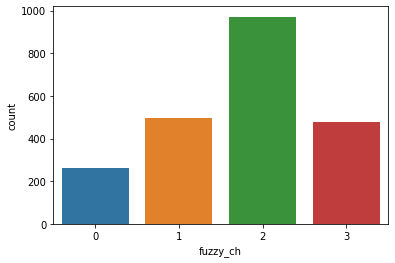

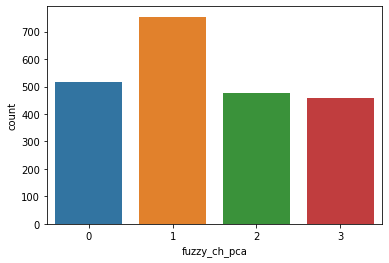

In [94]:
sns.countplot(x=df_filtered_["fuzzy_ch"])
plt.figure()
sns.countplot(x=df_filtered_["fuzzy_ch_pca"])

O agrupamento realizado usando os addos originais concentra muitas amostras no cluster de número 2, com 971 amostras. Para os dados com PCA, o maior cluster apresenta 754 amostra e há um gap menor observado entre ele e os demais conjuntos.

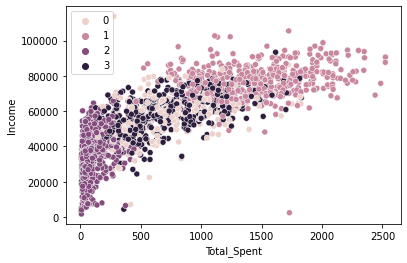

In [95]:
sns.scatterplot(data = df_filtered_, x=df_filtered_["Total_Spent"], y=df_filtered_["Income"], hue=df_filtered_["fuzzy_ch"])
plt.legend()

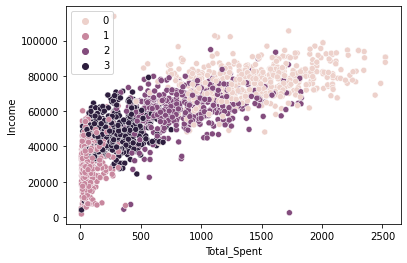

In [96]:
sns.scatterplot(data = df_filtered_, x=df_filtered_["Total_Spent"], y=df_filtered_["Income"], hue=df_filtered_["fuzzy_ch_pca"])
plt.legend()

Analisando visualmente os dois gráficos, três clusters sugeridos por ambos experimentos parecem ser parecidos com relação às variáveis analisadas. Porém, nota-se uma diferença relevante entre o cluster de número no experimento com dados originais e o mesmo para o com dados que utiliza PCA.
O que utiliza os dados originais agrupa os clientes com maior Income (aprox. maior que 80000) e Total_Spent (aprox. maior que 750) em um grupo diferente. Já para o agrupamento realizado usando dados do PCA, esse grupo não existe, e o algoritmo sugere um grupo de clientes na transição entre os clusters 2 e 3.

### Looking closely at the soft clustering

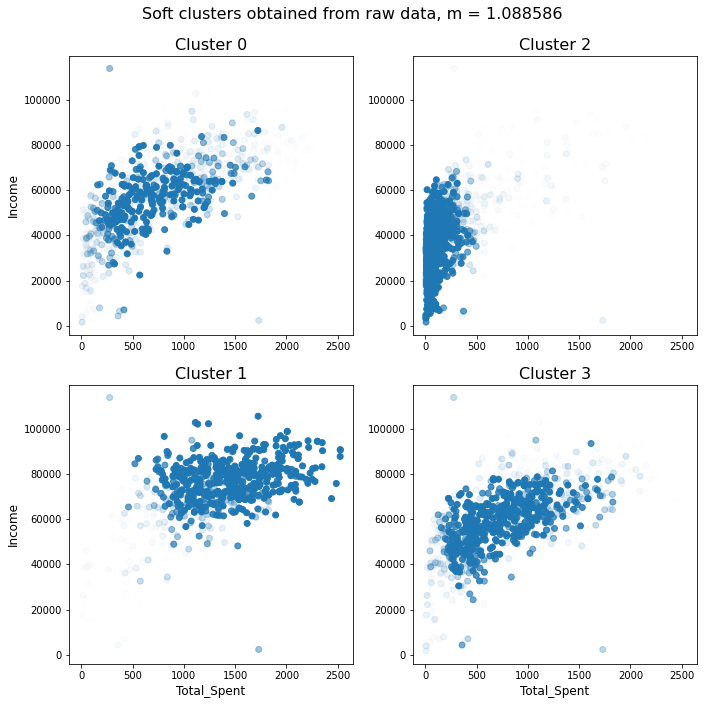

In [97]:
fig, (ax1, ax2) = plt.subplots(2, 2, figsize=(10,10))
plt.suptitle('Soft clusters obtained from raw data, m = %f' % models[0].m, fontsize=16)
ax1[0].scatter(df_filtered_["Total_Spent"], df_filtered_["Income"], alpha=df_filtered_['fuzzy_c0'], label='cluster 1')
ax1[0].set_ylabel('Income', fontsize=12)
ax1[0].set_title('Cluster 0', fontsize=16)
ax2[0].scatter(df_filtered_["Total_Spent"], df_filtered_["Income"], alpha=df_filtered_['fuzzy_c1'], label='cluster 2')
ax2[0].set_xlabel('Total_Spent', fontsize=12)
ax2[0].set_ylabel('Income', fontsize=12)
ax2[0].set_title('Cluster 1', fontsize=16)
ax1[1].scatter(df_filtered_["Total_Spent"], df_filtered_["Income"], alpha=df_filtered_['fuzzy_c2'], label='cluster 3')
ax1[1].set_title('Cluster 2', fontsize=16)
ax2[1].scatter(df_filtered_["Total_Spent"], df_filtered_["Income"], alpha=df_filtered_['fuzzy_c3'], label='cluster 4')
ax2[1].set_xlabel('Total_Spent', fontsize=12)
ax2[1].set_title('Cluster 3', fontsize=16)
fig.tight_layout(pad=1.5)
plt.show()

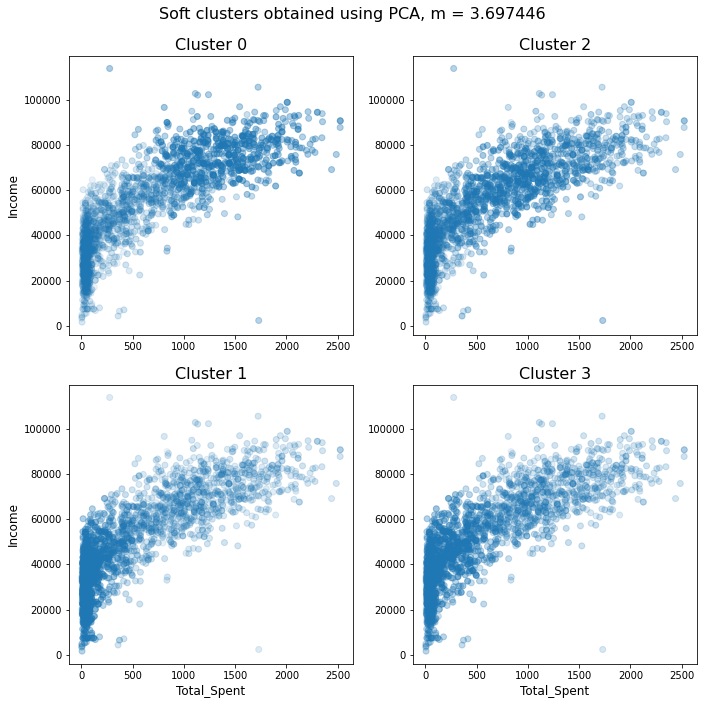

In [98]:
fig, (ax1, ax2) = plt.subplots(2, 2, figsize=(10,10))
plt.suptitle('Soft clusters obtained using PCA, m = %f' % models[1].m, fontsize=16)
ax1[0].scatter(df_filtered_["Total_Spent"], df_filtered_["Income"], alpha=df_filtered_['fuzzy_c0_pca'])
ax1[0].set_ylabel('Income', fontsize=12)
ax1[0].set_title('Cluster 0', fontsize=16)
ax2[0].scatter(df_filtered_["Total_Spent"], df_filtered_["Income"], alpha=df_filtered_['fuzzy_c1_pca'])
ax2[0].set_xlabel('Total_Spent', fontsize=12)
ax2[0].set_ylabel('Income', fontsize=12)
ax2[0].set_title('Cluster 1', fontsize=16)
ax1[1].scatter(df_filtered_["Total_Spent"], df_filtered_["Income"], alpha=df_filtered_['fuzzy_c2_pca'])
ax1[1].set_title('Cluster 2', fontsize=16)
ax2[1].scatter(df_filtered_["Total_Spent"], df_filtered_["Income"], alpha=df_filtered_['fuzzy_c3_pca'])
ax2[1].set_xlabel('Total_Spent', fontsize=12)
ax2[1].set_title('Cluster 3', fontsize=16)
fig.tight_layout(pad=1.5)
plt.show()

Nota-se maior nebulosidade na partição de dados realizada usando PCA (segundo gráfico). Os clusters gerados com os dados originais apresentam valores mais "crisps": a maioria dos connjuntos parecem ser formados por amostras com valor próximo de 1.0, e uma minoria possui valores de pertinência mais baixos, geralmente em regiões de borda.

In [99]:
models[0].m, models[1].m

(1.0885862106593263, 3.6974460233452553)

## "EXTRA": Avaliando a influência do parâmetro m

### Usando c = 2, p = 3

In [100]:
print('Estimated m_3:', m_3)

Estimated m_3: 3.6974460233452553


In [101]:
n_clusters = 2
p = 3
fcm_soft_labels_list = []
fcm_hard_labels_list = []
pc_list_2 = []
pec_list_2 = []
m_list = np.arange(1.0, m_3, 0.25)
m_list

array([1.  , 1.25, 1.5 , 1.75, 2.  , 2.25, 2.5 , 2.75, 3.  , 3.25, 3.5 ])

In [102]:
models_ = list()
for m_i in m_list:
    fcm = FCM(n_clusters = n_clusters, m = m_i, error=eps)
    fcm.fit(reduced_df_np_3)
    models_.append(fcm)

/usr/local/lib/python3.7/site-packages/fcmeans/main.py:58: RuntimeWarning: divide by zero encountered in double_scalars
  temp = FCM._dist(X, self._centers) ** float(2 / (self.m - 1))


In [103]:
for (m_i, model) in zip(m_list, models_):
    print('i:', i)
    pc = model.partition_coefficient
    pec = model.partition_entropy_coefficient
    pc_list_2.append(pc)
    pec_list_2.append(pec)
    fcm_centers = model.centers
    fcm_labels = model.predict(reduced_df_np_test_3)
    fcm_hard_labels_list.append(fcm_labels)
    fcm_soft_labels = model.soft_predict(reduced_df_np_test_3)
    fcm_soft_labels_list.append(fcm_soft_labels)
    print(f'n_clusters = {n_clusters}, PC = {pc:.3f}, PEC = {pec:.3f}')

i: 2
n_clusters = 2, PC = nan, PEC = nan
i: 2
n_clusters = 2, PC = 0.477, PEC = 0.055
i: 2
n_clusters = 2, PC = 0.446, PEC = 0.134
i: 2
n_clusters = 2, PC = 0.410, PEC = 0.218
i: 2
n_clusters = 2, PC = 0.377, PEC = 0.287
i: 2
n_clusters = 2, PC = 0.349, PEC = 0.339
i: 2
n_clusters = 2, PC = 0.328, PEC = 0.376
i: 2
n_clusters = 2, PC = 0.312, PEC = 0.404
i: 2
n_clusters = 2, PC = 0.300, PEC = 0.424
i: 2
n_clusters = 2, PC = 0.290, PEC = 0.439
i: 2
n_clusters = 2, PC = 0.283, PEC = 0.450


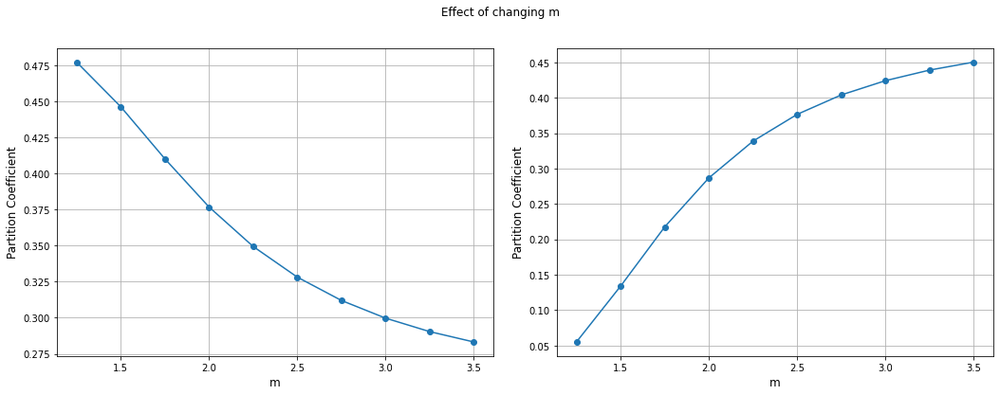

In [104]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,6))
plt.suptitle('Effect of changing m')
ax1.plot(m_list, pc_list_2, marker="o")
ax1.set_xlabel('m', fontsize=12)
ax1.set_ylabel('Partition Coefficient', fontsize=12)
ax1.grid(True)
ax2.plot(m_list, pec_list_2, marker="o")
ax2.set_xlabel('m', fontsize=12)
ax2.set_ylabel('Partition Coefficient', fontsize=12)
fig.tight_layout(pad=2)
ax2.grid(True)
plt.show()

### Usando c = 4, p = 3

In [105]:
n_clusters = 4
fcm_soft_labels_list = []
fcm_hard_labels_list = []
pc_list_4 = []
pec_list_4 = []

In [106]:
models_ = list()
for m_i in m_list:
    fcm = FCM(n_clusters = n_clusters, m = m_i, error=eps)
    fcm.fit(reduced_df_np_3)
    models_.append(fcm)

/usr/local/lib/python3.7/site-packages/fcmeans/main.py:58: RuntimeWarning: divide by zero encountered in double_scalars
  temp = FCM._dist(X, self._centers) ** float(2 / (self.m - 1))


In [107]:
for (m_i, model) in zip(m_list, models_):
    print('i:', i)
    pc = model.partition_coefficient
    pec = model.partition_entropy_coefficient
    pc_list_4.append(pc)
    pec_list_4.append(pec)
    fcm_centers = model.centers
    fcm_labels = model.predict(reduced_df_np_test_3)
    fcm_hard_labels_list.append(fcm_labels)
    fcm_soft_labels = model.soft_predict(reduced_df_np_test_3)
    fcm_soft_labels_list.append(fcm_soft_labels)
    print(f'n_clusters = {n_clusters}, PC = {pc:.3f}, PEC = {pec:.3f}')

i: 2
n_clusters = 4, PC = nan, PEC = nan
i: 2
n_clusters = 4, PC = 0.228, PEC = 0.057
i: 2
n_clusters = 4, PC = 0.188, PEC = 0.167
i: 2
n_clusters = 4, PC = 0.154, PEC = 0.258
i: 2
n_clusters = 4, PC = 0.128, PEC = 0.328
i: 2
n_clusters = 4, PC = 0.109, PEC = 0.377
i: 2
n_clusters = 4, PC = 0.097, PEC = 0.409
i: 2
n_clusters = 4, PC = 0.088, PEC = 0.432
i: 2
n_clusters = 4, PC = 0.082, PEC = 0.447
i: 2
n_clusters = 4, PC = 0.078, PEC = 0.459
i: 2
n_clusters = 4, PC = 0.075, PEC = 0.467


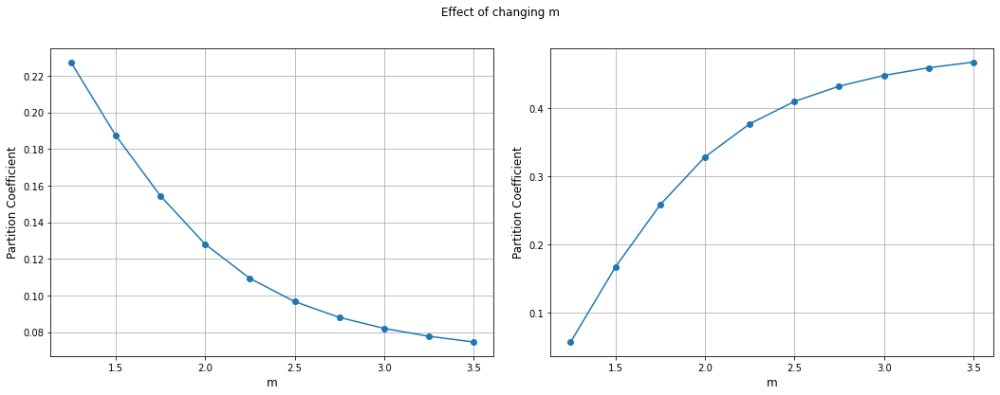

In [108]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,6))
plt.suptitle('Effect of changing m')
ax1.plot(m_list, pc_list_4, marker="o")
ax1.set_xlabel('m', fontsize=12)
ax1.set_ylabel('Partition Coefficient', fontsize=12)
ax1.grid(True)
ax2.plot(m_list, pec_list_4, marker="o")
ax2.set_xlabel('m', fontsize=12)
ax2.set_ylabel('Partition Coefficient', fontsize=12)
fig.tight_layout(pad=2)
ax2.grid(True)
plt.show()

### Comparando

Juntando ambos plots:

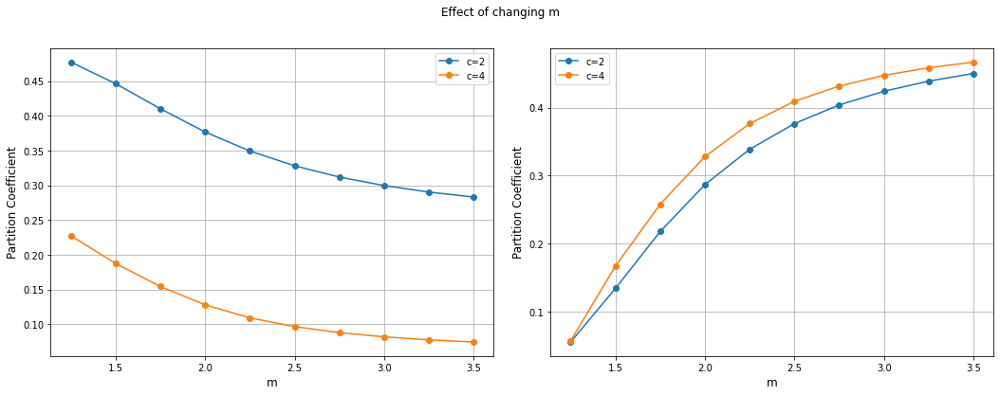

In [109]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,6))
plt.suptitle('Effect of changing m')
ax1.plot(m_list, pc_list_2, marker="o", label='c=2')
ax1.plot(m_list, pc_list_4, marker="o", label='c=4')
ax1.set_xlabel('m', fontsize=12)
ax1.set_ylabel('Partition Coefficient', fontsize=12)
ax1.grid(True)
ax2.plot(m_list, pec_list_2, marker="o", label='c=2')
ax2.plot(m_list, pec_list_4, marker="o", label='c=4')
ax2.set_xlabel('m', fontsize=12)
ax2.set_ylabel('Partition Coefficient', fontsize=12)
fig.tight_layout(pad=2)
ax2.grid(True)
ax1.legend()
ax2.legend()
plt.show()

A escolha do coeficiente fuzzy "m" parece parece influenciar mais o resultado quando se utiliza um maior número de clusters.

# K-Means Clustering [c = 4]

Ajuste do K-Means ao conjunto de dados. Utilizando o mesmo número de clusters definido para o FCM.

In [154]:
from sklearn.cluster import KMeans
n_clusters = 4

In [187]:
random_seed = 42

## *** EXPERIMENTO 3: Baseline

In [188]:
kmeans = KMeans(n_clusters=4, random_state=random_seed).fit(data_train)
kmeans_labels = kmeans.predict(data_test)

In [189]:
kmeans_labels = kmeans.predict(scaled_df_array)

In [190]:
df_filtered_["kmeans_c"] = kmeans_labels
df_filtered_.head()

,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,...,fuzzy_c2,fuzzy_c3,fuzzy_ch,fuzzy_c0_pca,fuzzy_c1_pca,fuzzy_c2_pca,fuzzy_c3_pca,fuzzy_ch_pca,kmeans_c,kmeans_c_pca
95,2,4,30096.0,1,0,30,5,3,11,12,...,1.000000,3.729228e-08,2,0.134922,0.439894,0.166979,0.258205,1,0,1
154,4,3,61010.0,0,1,57,888,0,57,0,...,0.000001,9.939576e-01,3,0.215582,0.180163,0.373981,0.230275,2,2,3
2101,4,3,67911.0,0,1,63,529,0,356,63,...,0.000007,9.921587e-01,3,0.237186,0.166649,0.389586,0.206579,2,2,3
1872,2,0,44503.0,1,1,83,31,1,8,0,...,0.999738,4.023868e-06,2,0.127818,0.390140,0.170043,0.311999,1,0,1
926,2,4,77583.0,0,0,93,372,23,384,250,...,0.000107,4.832620e-03,1,0.403887,0.171591,0.240999,0.183523,0,1,2


/usr/local/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


<AxesSubplot:ylabel='count'>

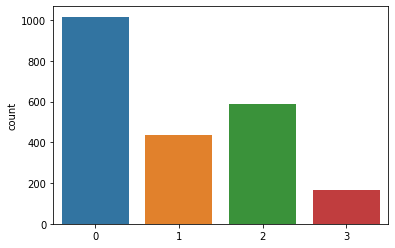

In [191]:
sns.countplot(kmeans_labels)

In [192]:
df_filtered_["kmeans_c"].value_counts()

0    1017
2     588
1     434
3     166
Name: kmeans_c, dtype: int64

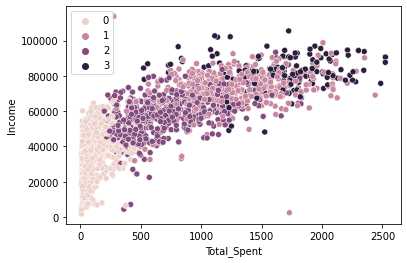

In [193]:
sns.scatterplot(data = df_filtered_, x=df_filtered_["Total_Spent"], y=df_filtered_["Income"], hue=df_filtered_["kmeans_c"])
plt.legend()

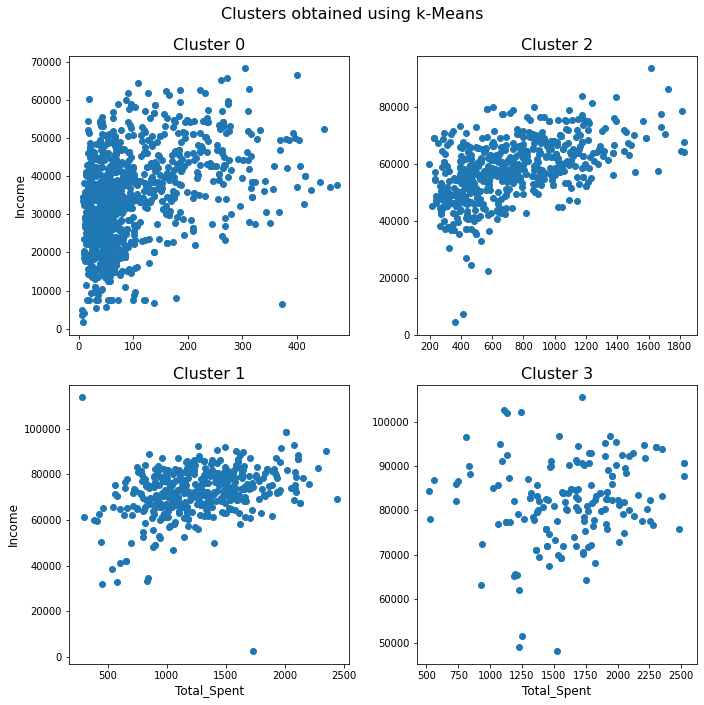

In [194]:
fig, (ax1, ax2) = plt.subplots(2, 2, figsize=(10,10))
plt.suptitle('Clusters obtained using k-Means', fontsize=16)
ax1[0].scatter(df_filtered_[df_filtered_['kmeans_c'] == 0]["Total_Spent"], df_filtered_[df_filtered_['kmeans_c'] == 0]["Income"])
ax1[0].set_ylabel('Income', fontsize=12)
ax1[0].set_title('Cluster 0', fontsize=16)
ax2[0].scatter(df_filtered_[df_filtered_['kmeans_c'] == 1]["Total_Spent"], df_filtered_[df_filtered_['kmeans_c'] == 1]["Income"])
ax2[0].set_xlabel('Total_Spent', fontsize=12)
ax2[0].set_ylabel('Income', fontsize=12)
ax2[0].set_title('Cluster 1', fontsize=16)
ax1[1].scatter(df_filtered_[df_filtered_['kmeans_c'] == 2]["Total_Spent"], df_filtered_[df_filtered_['kmeans_c'] == 2]["Income"])
ax1[1].set_title('Cluster 2', fontsize=16)
ax2[1].scatter(df_filtered_[df_filtered_['kmeans_c'] == 3]["Total_Spent"], df_filtered_[df_filtered_['kmeans_c'] == 3]["Income"])
ax2[1].set_xlabel('Total_Spent', fontsize=12)
ax2[1].set_title('Cluster 3', fontsize=16)
fig.tight_layout(pad=1.5)
plt.show()

## *** EXPERIMENTO 4: PCA, p = 3

In [195]:
kmeans_pca = KMeans(n_clusters=4, random_state=random_seed).fit(reduced_df_np_3)
kmeans_labels = kmeans_pca.predict(reduced_df_np_test_3)

In [196]:
kmeans_labels = kmeans_pca.predict(reduced_df_array_3)

In [197]:
df_filtered_["kmeans_c_pca"] = kmeans_labels
df_filtered_.head()

,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,...,fuzzy_c2,fuzzy_c3,fuzzy_ch,fuzzy_c0_pca,fuzzy_c1_pca,fuzzy_c2_pca,fuzzy_c3_pca,fuzzy_ch_pca,kmeans_c,kmeans_c_pca
95,2,4,30096.0,1,0,30,5,3,11,12,...,1.000000,3.729228e-08,2,0.134922,0.439894,0.166979,0.258205,1,0,0
154,4,3,61010.0,0,1,57,888,0,57,0,...,0.000001,9.939576e-01,3,0.215582,0.180163,0.373981,0.230275,2,2,1
2101,4,3,67911.0,0,1,63,529,0,356,63,...,0.000007,9.921587e-01,3,0.237186,0.166649,0.389586,0.206579,2,2,1
1872,2,0,44503.0,1,1,83,31,1,8,0,...,0.999738,4.023868e-06,2,0.127818,0.390140,0.170043,0.311999,1,0,0
926,2,4,77583.0,0,0,93,372,23,384,250,...,0.000107,4.832620e-03,1,0.403887,0.171591,0.240999,0.183523,0,1,3


/usr/local/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


<AxesSubplot:ylabel='count'>

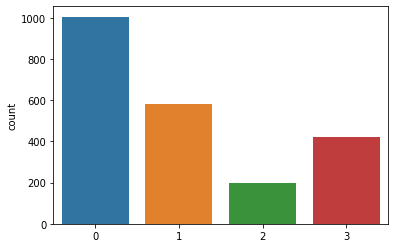

In [198]:
sns.countplot(kmeans_labels)

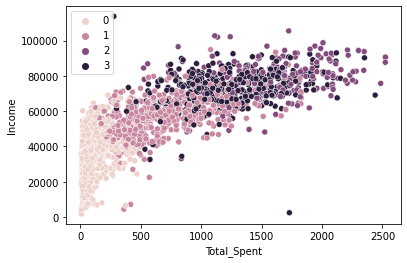

In [199]:
sns.scatterplot(data = df_filtered_, x=df_filtered_["Total_Spent"], y=df_filtered_["Income"], hue=df_filtered_["kmeans_c_pca"])
plt.legend()

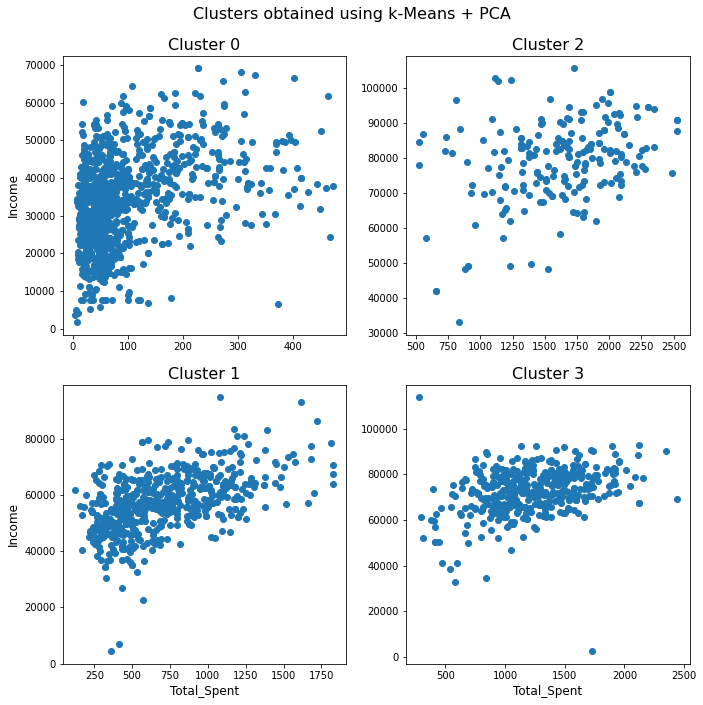

In [200]:
fig, (ax1, ax2) = plt.subplots(2, 2, figsize=(10,10))
plt.suptitle('Clusters obtained using k-Means + PCA', fontsize=16)
ax1[0].scatter(df_filtered_[df_filtered_['kmeans_c_pca'] == 0]["Total_Spent"], df_filtered_[df_filtered_['kmeans_c_pca'] == 0]["Income"])
ax1[0].set_ylabel('Income', fontsize=12)
ax1[0].set_title('Cluster 0', fontsize=16)
ax2[0].scatter(df_filtered_[df_filtered_['kmeans_c_pca'] == 1]["Total_Spent"], df_filtered_[df_filtered_['kmeans_c_pca'] == 1]["Income"])
ax2[0].set_xlabel('Total_Spent', fontsize=12)
ax2[0].set_ylabel('Income', fontsize=12)
ax2[0].set_title('Cluster 1', fontsize=16)
ax1[1].scatter(df_filtered_[df_filtered_['kmeans_c_pca'] == 2]["Total_Spent"], df_filtered_[df_filtered_['kmeans_c_pca'] == 2]["Income"])
ax1[1].set_title('Cluster 2', fontsize=16)
ax2[1].scatter(df_filtered_[df_filtered_['kmeans_c_pca'] == 3]["Total_Spent"], df_filtered_[df_filtered_['kmeans_c_pca'] == 3]["Income"])
ax2[1].set_xlabel('Total_Spent', fontsize=12)
ax2[1].set_title('Cluster 3', fontsize=16)
fig.tight_layout(pad=1.5)
plt.show()

## Comparação: Baseline e PCA

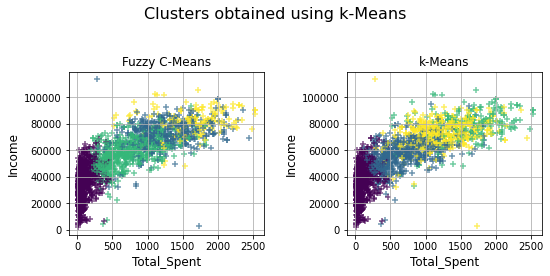

In [201]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=plt.figaspect(0.5))
plt.suptitle('Clusters obtained using k-Means', fontsize=16)
ax1.scatter(df_filtered_["Total_Spent"], df_filtered_["Income"], c=df_filtered_["kmeans_c"], label='original', alpha=0.7, marker='+')
ax1.set_xlabel('Total_Spent', fontsize=12)
ax1.set_ylabel('Income', fontsize=12)
ax1.set_title('Fuzzy C-Means')
ax1.grid(True)
ax2.scatter(df_filtered_["Total_Spent"], df_filtered_["Income"], c=df_filtered_["kmeans_c_pca"], alpha=0.7, marker='+')
ax2.set_xlabel('Total_Spent', fontsize=12)
ax2.set_ylabel('Income', fontsize=12)
ax2.set_title('k-Means')
fig.tight_layout(pad=2)
ax2.grid(True)
plt.show()

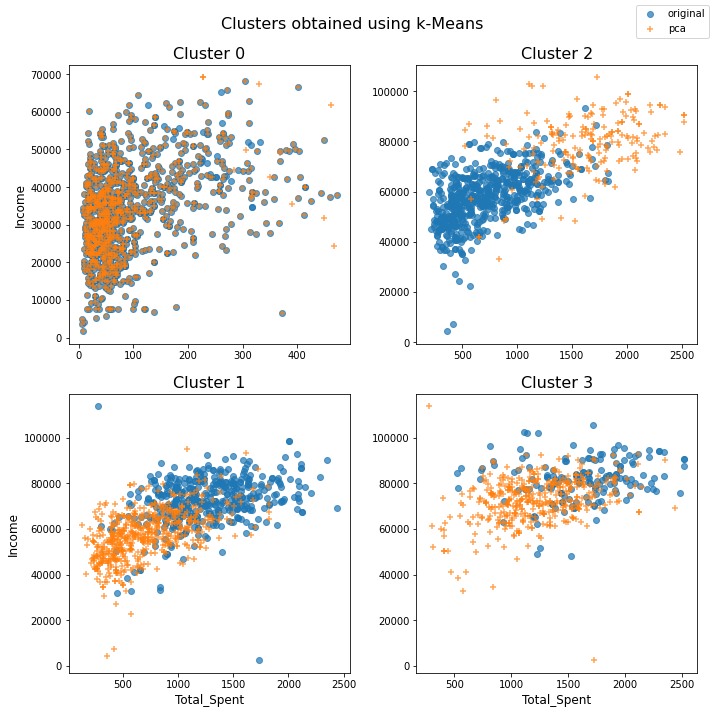

In [202]:
fig, (ax1, ax2) = plt.subplots(2, 2, figsize=(10,10))
plt.suptitle('Clusters obtained using k-Means', fontsize=16)
ax1[0].scatter(df_filtered_[df_filtered_['kmeans_c'] == 0]["Total_Spent"], df_filtered_[df_filtered_['kmeans_c'] == 0]["Income"], label='original', alpha=0.7)
ax1[0].scatter(df_filtered_[df_filtered_['kmeans_c_pca'] == 0]["Total_Spent"], df_filtered_[df_filtered_['kmeans_c_pca'] == 0]["Income"], label='pca', alpha=0.7, marker='+')
ax1[0].set_ylabel('Income', fontsize=12)
ax1[0].set_title('Cluster 0', fontsize=16)
ax2[0].scatter(df_filtered_[df_filtered_['kmeans_c'] == 1]["Total_Spent"], df_filtered_[df_filtered_['kmeans_c'] == 1]["Income"], alpha=0.7)
ax2[0].scatter(df_filtered_[df_filtered_['kmeans_c_pca'] == 1]["Total_Spent"], df_filtered_[df_filtered_['kmeans_c_pca'] == 1]["Income"], alpha=0.7, marker='+')
ax2[0].set_xlabel('Total_Spent', fontsize=12)
ax2[0].set_ylabel('Income', fontsize=12)
ax2[0].set_title('Cluster 1', fontsize=16)
ax1[1].scatter(df_filtered_[df_filtered_['kmeans_c'] == 2]["Total_Spent"], df_filtered_[df_filtered_['kmeans_c'] == 2]["Income"], alpha=0.7)
ax1[1].scatter(df_filtered_[df_filtered_['kmeans_c_pca'] == 2]["Total_Spent"], df_filtered_[df_filtered_['kmeans_c_pca'] == 2]["Income"], alpha=0.7, marker='+')
ax1[1].set_title('Cluster 2', fontsize=16)
ax2[1].scatter(df_filtered_[df_filtered_['kmeans_c'] == 3]["Total_Spent"], df_filtered_[df_filtered_['kmeans_c'] == 3]["Income"], alpha=0.7)
ax2[1].scatter(df_filtered_[df_filtered_['kmeans_c_pca'] == 3]["Total_Spent"], df_filtered_[df_filtered_['kmeans_c_pca'] == 3]["Income"], alpha=0.7, marker='+')
ax2[1].set_xlabel('Total_Spent', fontsize=12)
ax2[1].set_title('Cluster 3', fontsize=16)
fig.legend()
fig.tight_layout(pad=1.5)
plt.show()

Por inspeção visual, nota-se que a clusterização ficou próxima. O que aconteceu foi uma troca das 'labels' pela função utilizada. Em número de amostras os clusters obtidos são próximos:

In [203]:
df_filtered_['kmeans_c'].value_counts()

0    1017
2     588
1     434
3     166
Name: kmeans_c, dtype: int64

In [204]:
df_filtered_['kmeans_c_pca'].value_counts()

0    1006
1     580
3     423
2     196
Name: kmeans_c_pca, dtype: int64

# Comparação k-Means e Fuzzy C-Means

## Baseline

### Comparação Visual

In [205]:
df_filtered_.head()

,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,...,fuzzy_c2,fuzzy_c3,fuzzy_ch,fuzzy_c0_pca,fuzzy_c1_pca,fuzzy_c2_pca,fuzzy_c3_pca,fuzzy_ch_pca,kmeans_c,kmeans_c_pca
95,2,4,30096.0,1,0,30,5,3,11,12,...,1.000000,3.729228e-08,2,0.134922,0.439894,0.166979,0.258205,1,0,0
154,4,3,61010.0,0,1,57,888,0,57,0,...,0.000001,9.939576e-01,3,0.215582,0.180163,0.373981,0.230275,2,2,1
2101,4,3,67911.0,0,1,63,529,0,356,63,...,0.000007,9.921587e-01,3,0.237186,0.166649,0.389586,0.206579,2,2,1
1872,2,0,44503.0,1,1,83,31,1,8,0,...,0.999738,4.023868e-06,2,0.127818,0.390140,0.170043,0.311999,1,0,0
926,2,4,77583.0,0,0,93,372,23,384,250,...,0.000107,4.832620e-03,1,0.403887,0.171591,0.240999,0.183523,0,1,3


In [206]:
df_filtered_['fuzzy_ch'].value_counts()

2    971
1    495
3    476
0    263
Name: fuzzy_ch, dtype: int64

In [207]:
df_filtered_['kmeans_c'].value_counts()

0    1017
2     588
1     434
3     166
Name: kmeans_c, dtype: int64

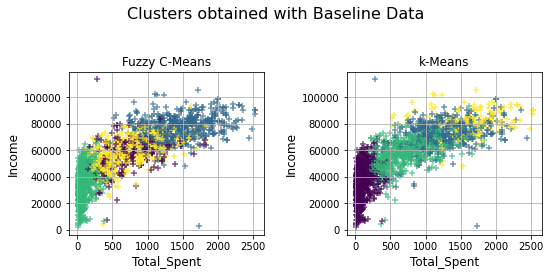

In [208]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=plt.figaspect(0.5))
plt.suptitle('Clusters obtained with Baseline Data', fontsize=16)
ax1.scatter(df_filtered_["Total_Spent"], df_filtered_["Income"], c=df_filtered_["fuzzy_ch"], alpha=0.7, marker='+')
ax1.set_xlabel('Total_Spent', fontsize=12)
ax1.set_ylabel('Income', fontsize=12)
ax1.set_title('Fuzzy C-Means')
# ax1.legend()
ax1.grid(True)
ax2.scatter(df_filtered_["Total_Spent"], df_filtered_["Income"], c=df_filtered_["kmeans_c"], alpha=0.7, marker='+')
ax2.set_xlabel('Total_Spent', fontsize=12)
ax2.set_ylabel('Income', fontsize=12)
ax2.set_title('k-Means')
fig.tight_layout(pad=2)
ax2.grid(True)
# ax2.legend()
plt.show()

Alterando a ordem dos plots para facilitar visualização e comparação dos clusters:

In [209]:
# - Total_Spent e MntWines
# - Total_Spent e MntMeatProducts
# - Total_Spent e NumCatalogPurchases
# - Total_Spent e Income

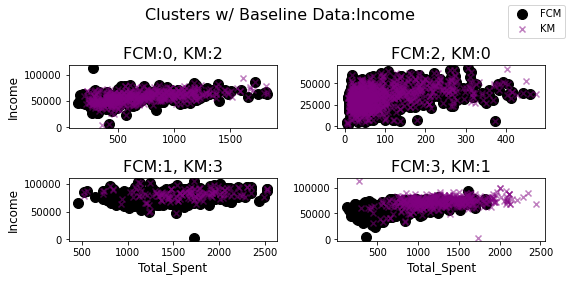

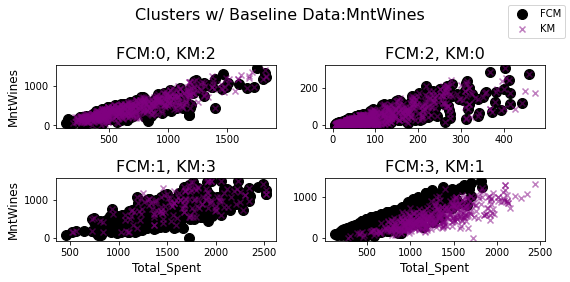

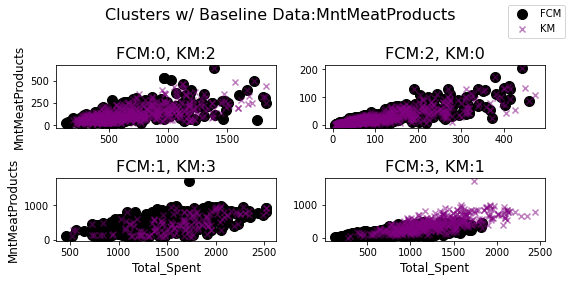

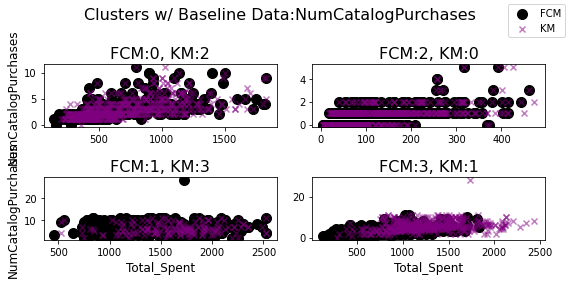

In [221]:
vars_of_interest = ["Income","MntWines", "MntMeatProducts", "NumCatalogPurchases"]

for var_i in vars_of_interest:
    fig, (ax1, ax2) = plt.subplots(2, 2, figsize=plt.figaspect(0.5))
    plt.suptitle('Clusters w/ Baseline Data:' + var_i, fontsize=16)
    ax1[0].scatter(df_filtered_[df_filtered_['fuzzy_ch'] == 0]["Total_Spent"], df_filtered_[df_filtered_['fuzzy_ch'] == 0][var_i], label='FCM', s=100, c='black')
    ax1[0].scatter(df_filtered_[df_filtered_['kmeans_c'] == 2]["Total_Spent"], df_filtered_[df_filtered_['kmeans_c'] == 2][var_i], label='KM', alpha=0.5, marker="x", c='purple')
    ax1[0].set_ylabel(var_i, fontsize=12)
    ax1[0].set_title('FCM:0, KM:2', fontsize=16)
    ax2[0].scatter(df_filtered_[df_filtered_['fuzzy_ch'] == 1]["Total_Spent"], df_filtered_[df_filtered_['fuzzy_ch'] == 1][var_i], s=100, c='black')
    ax2[0].scatter(df_filtered_[df_filtered_['kmeans_c'] == 3]["Total_Spent"], df_filtered_[df_filtered_['kmeans_c'] == 3][var_i], alpha=0.5, marker="x", c='purple')
    ax2[0].set_xlabel('Total_Spent', fontsize=12)
    ax2[0].set_ylabel(var_i, fontsize=12)
    ax2[0].set_title('FCM:1, KM:3', fontsize=16)
    ax1[1].scatter(df_filtered_[df_filtered_['fuzzy_ch'] == 2]["Total_Spent"], df_filtered_[df_filtered_['fuzzy_ch'] == 2][var_i], s=100, c='black')
    ax1[1].scatter(df_filtered_[df_filtered_['kmeans_c'] == 0]["Total_Spent"], df_filtered_[df_filtered_['kmeans_c'] == 0][var_i], alpha=0.5, marker="x", c='purple')
    ax1[1].set_title('FCM:2, KM:0', fontsize=16)
    ax2[1].scatter(df_filtered_[df_filtered_['fuzzy_ch'] == 3]["Total_Spent"], df_filtered_[df_filtered_['fuzzy_ch'] == 3][var_i], s=100, c='black')
    ax2[1].scatter(df_filtered_[df_filtered_['kmeans_c'] == 1]["Total_Spent"], df_filtered_[df_filtered_['kmeans_c'] == 1][var_i], alpha=0.5, marker="x", c='purple')
    ax2[1].set_xlabel('Total_Spent', fontsize=12)
    ax2[1].set_title('FCM:3, KM:1', fontsize=16)
    fig.legend()
    fig.tight_layout(pad=1.5)
    plt.show()

Notamos que há uma sobreposição entre os clusters obtidos tanto para o FCM (hard) e o K-Means quando utilizado os dados originais de entrada.

### Análise dos Clusters Gerados pelo FCM

<AxesSubplot:xlabel='Total_Spent', ylabel='Income'>

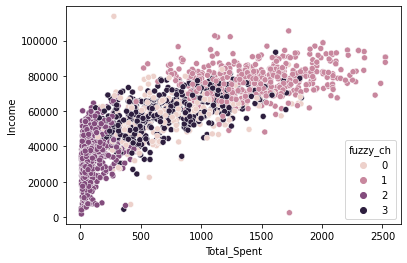

In [223]:
sns.scatterplot(data = df_filtered_, x=df_filtered_["Total_Spent"], y=df_filtered_["Income"], hue=df_filtered_["fuzzy_ch"])

<AxesSubplot:xlabel='fuzzy_ch', ylabel='Total_Spent'>

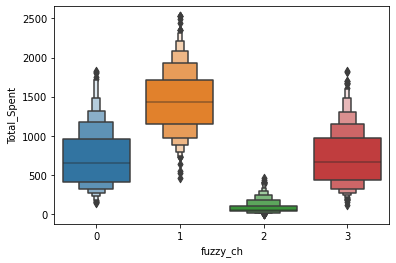

In [212]:
sns.boxenplot(x="fuzzy_ch", y="Total_Spent", data=df_filtered_)

Os gráficos indicam que será benéfico investigar o caso de lançar campanhas voltadas para o cluster 2, que são os clientes com um salário baixo e um gasto também baixo.

### Análise dos Clusters Gerados pelo KM

<AxesSubplot:xlabel='Total_Spent', ylabel='Income'>

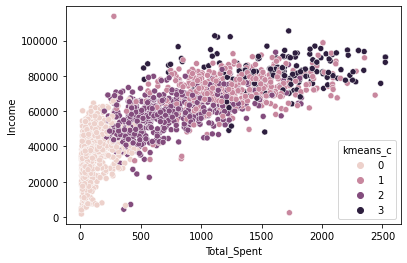

In [213]:
sns.scatterplot(data = df_filtered_, x=df_filtered_["Total_Spent"], y=df_filtered_["Income"], hue=df_filtered_["kmeans_c"])

<AxesSubplot:xlabel='kmeans_c', ylabel='Total_Spent'>

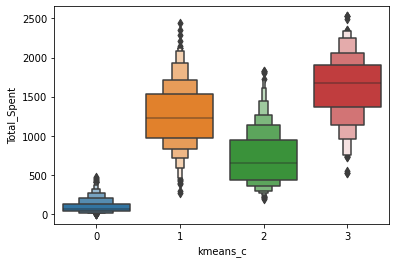

In [214]:
sns.boxenplot(x="kmeans_c", y="Total_Spent", data=df_filtered_)

Analogamente ao que foi indicado pelo FCM, o cluster referente aos clientes com menor salário se refere também aos clientes que menos consomem produtos da empresa. Seria interessante pensar em campanhas para esse público alvo, realizando análises estatísticas mais específicas voltadas para o grupo.

## PCA, p = 3

In [215]:
df_filtered_['fuzzy_ch_pca'].value_counts()

1    754
0    518
2    476
3    457
Name: fuzzy_ch_pca, dtype: int64

In [216]:
df_filtered_['kmeans_c_pca'].value_counts()

0    1006
1     580
3     423
2     196
Name: kmeans_c_pca, dtype: int64

Ao utilizar o PCA, os resultados obtidos para cada método divergem mais.

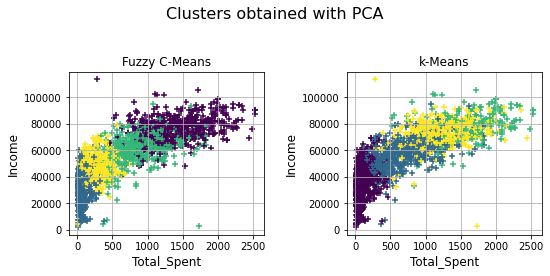

In [224]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=plt.figaspect(0.5))
plt.suptitle('Clusters obtained with PCA', fontsize=16)
ax1.scatter(df_filtered_["Total_Spent"], df_filtered_["Income"], c=df_filtered_["fuzzy_ch_pca"], marker='+')
ax1.set_xlabel('Total_Spent', fontsize=12)
ax1.set_ylabel('Income', fontsize=12)
ax1.set_title('Fuzzy C-Means')
ax1.grid(True)
ax2.scatter(df_filtered_["Total_Spent"], df_filtered_["Income"], c=df_filtered_["kmeans_c_pca"], marker='+')
ax2.set_xlabel('Total_Spent', fontsize=12)
ax2.set_ylabel('Income', fontsize=12)
ax2.set_title('k-Means')
fig.tight_layout(pad=2)
ax2.grid(True)
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


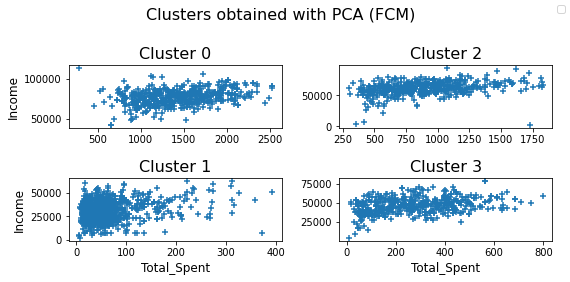

In [218]:
fig, (ax1, ax2) = plt.subplots(2, 2, figsize=plt.figaspect(0.5))
plt.suptitle('Clusters obtained with PCA (FCM)', fontsize=16)
ax1[0].scatter(df_filtered_[df_filtered_['fuzzy_ch_pca'] == 0]["Total_Spent"], df_filtered_[df_filtered_['fuzzy_ch_pca'] == 0]["Income"],  marker='+')
# ax1[0].scatter(df_filtered_[df_filtered_['kmeans_c_pca'] == 2]["Total_Spent"], df_filtered_[df_filtered_['kmeans_c_pca'] == 2]["Income"], label='KM', alpha=0.5, marker="+")
ax1[0].set_ylabel('Income', fontsize=12)
ax1[0].set_title('Cluster 0', fontsize=16)
ax2[0].scatter(df_filtered_[df_filtered_['fuzzy_ch_pca'] == 1]["Total_Spent"], df_filtered_[df_filtered_['fuzzy_ch_pca'] == 1]["Income"], marker='+')
# ax2[0].scatter(df_filtered_[df_filtered_['kmeans_c_pca'] == 3]["Total_Spent"], df_filtered_[df_filtered_['kmeans_c_pca'] == 3]["Income"], alpha=0.5, marker="+")
ax2[0].set_xlabel('Total_Spent', fontsize=12)
ax2[0].set_ylabel('Income', fontsize=12)
ax2[0].set_title('Cluster 1', fontsize=16)
ax1[1].scatter(df_filtered_[df_filtered_['fuzzy_ch_pca'] == 2]["Total_Spent"], df_filtered_[df_filtered_['fuzzy_ch_pca'] == 2]["Income"], marker='+')
# ax1[1].scatter(df_filtered_[df_filtered_['kmeans_c_pca'] == 3]["Total_Spent"], df_filtered_[df_filtered_['kmeans_c_pca'] == 3]["Income"], alpha=0.5, marker="+")
ax1[1].set_title('Cluster 2', fontsize=16)
ax2[1].scatter(df_filtered_[df_filtered_['fuzzy_ch_pca'] == 3]["Total_Spent"], df_filtered_[df_filtered_['fuzzy_ch_pca'] == 3]["Income"], marker='+')
# ax2[1].scatter(df_filtered_[df_filtered_['kmeans_c_pca'] == 3]["Total_Spent"], df_filtered_[df_filtered_['kmeans_c_pca'] == 3]["Income"], alpha=0.5, marker="+")
ax2[1].set_xlabel('Total_Spent', fontsize=12)
ax2[1].set_title('Cluster 3', fontsize=16)
fig.legend()
fig.tight_layout(pad=1.5)
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


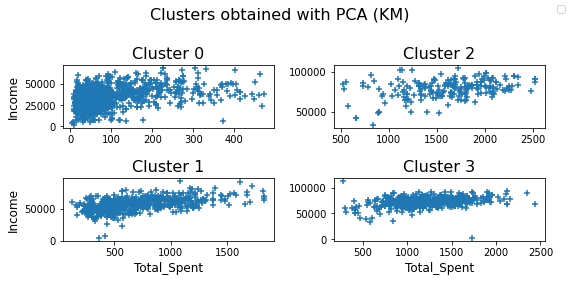

In [219]:
fig, (ax1, ax2) = plt.subplots(2, 2, figsize=plt.figaspect(0.5))
plt.suptitle('Clusters obtained with PCA (KM)', fontsize=16)
ax1[0].scatter(df_filtered_[df_filtered_['kmeans_c_pca'] == 0]["Total_Spent"], df_filtered_[df_filtered_['kmeans_c_pca'] == 0]["Income"], marker='+')
ax1[0].set_ylabel('Income', fontsize=12)
ax1[0].set_title('Cluster 0', fontsize=16)
ax2[0].scatter(df_filtered_[df_filtered_['kmeans_c_pca'] == 1]["Total_Spent"], df_filtered_[df_filtered_['kmeans_c_pca'] == 1]["Income"], marker='+')
ax2[0].set_xlabel('Total_Spent', fontsize=12)
ax2[0].set_ylabel('Income', fontsize=12)
ax2[0].set_title('Cluster 1', fontsize=16)
ax1[1].scatter(df_filtered_[df_filtered_['kmeans_c_pca'] == 2]["Total_Spent"], df_filtered_[df_filtered_['kmeans_c_pca'] == 2]["Income"], marker='+')
ax1[1].set_title('Cluster 2', fontsize=16)
ax2[1].scatter(df_filtered_[df_filtered_['kmeans_c_pca'] == 3]["Total_Spent"], df_filtered_[df_filtered_['kmeans_c_pca'] == 3]["Income"], marker='+')
ax2[1].set_xlabel('Total_Spent', fontsize=12)
ax2[1].set_title('Cluster 3', fontsize=16)
fig.legend()
fig.tight_layout(pad=1.5)
plt.show()

### Análise dos Clusters Gerados pelo FCM + PCA

<AxesSubplot:xlabel='Total_Spent', ylabel='Income'>

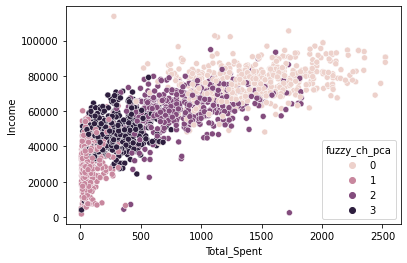

In [234]:
sns.scatterplot(data = df_filtered_, x=df_filtered_["Total_Spent"], y=df_filtered_["Income"], hue=df_filtered_["fuzzy_ch_pca"])

<AxesSubplot:xlabel='fuzzy_ch_pca', ylabel='Total_Spent'>

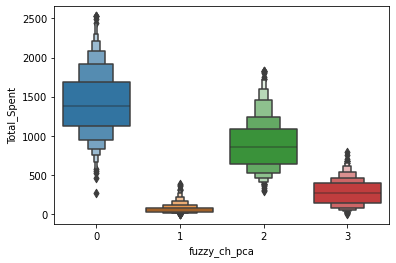

In [236]:
sns.boxenplot(x="fuzzy_ch_pca", y="Total_Spent", data=df_filtered_)

No experimento com o conjunto de atributos original, o FCM havia indicado apenas 1 cluster com baixo consumo dos produtos da empresa -- refente a clientes com salário de baixo a médio. Com o experimento utilizando dados de PCA, o modelo passa a indicar clusters mais "intuitivos": o cluster 0 abriga os clientes com maiores salários e logo apresenta o maior consumo. O cluster 2, que se posiciona no gráfico de dispersão um pouco abaixo e à esquerda do 0, tem um consumo mediano indicado no box-plot. A maior diferença observada na saída do algoritmo é que para os dados com PCA, o FCM indica um cluster com baixo consumo indicado pelo número 3 de clientes que possuem salário de baixo a médio; e também um outro cluster com salário muito baixo e consumo muito baixo, indicado pelo número 1. Logo, o FCM parece ter se beneficiado da aplicação de PCA no conjunto de dados, resultando em um resultado com grupos mais distintos entre si.

### Análise dos Clusters Gerados pelo KM

<AxesSubplot:xlabel='Total_Spent', ylabel='Income'>

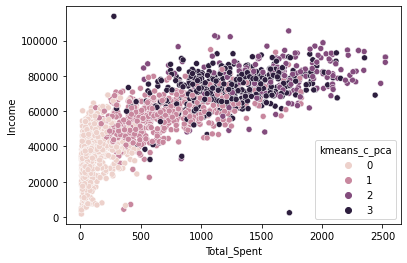

In [237]:
sns.scatterplot(data = df_filtered_, x=df_filtered_["Total_Spent"], y=df_filtered_["Income"], hue=df_filtered_["kmeans_c_pca"])

<AxesSubplot:xlabel='kmeans_c_pca', ylabel='Total_Spent'>

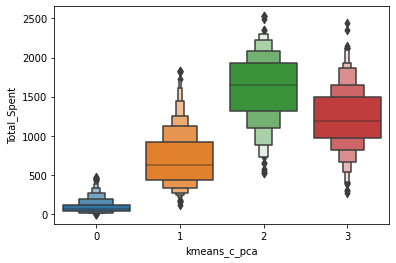

In [239]:
sns.boxenplot(x="kmeans_c_pca", y="Total_Spent", data=df_filtered_)

Para o k-Means, o modelo continua apontando 3 clusters com consumo de médio a alto, e um cluster de consumo inferior -- referente aos clientes com salário de baixo a médio. Porém, com o PCA, o k-Means aglomera mais clientes em seu cluster 0 (aproximadamente metade dos clientes do conjunto de dados). Este conjunto indicado é o de menor consumo quando comparado aos demais, o que é evidenciado ao analisar o box-plot dos clusters. Essa aglomeração maior em um único cluster pode indicar que a realização de uma campanha voltada para este grupo de clientes seja mais eficaz e mais simples de direcionar ao público-alvo do que o investimento em dois grupos distintos proposto pelo FCM com PCA. 

Por outro lado, os resultados obtidos com o FCM parece apresentar uma maior granularidade com relação ao perfil do consumidor. O que pode ser avaliado futuramente são os grupos de consumidores segmentados testando diferentes valores do coeficiente nebuloso, como uma forma de ajuste da resposta do modelo à nebulosidade inerente ao conjunto.